In [1]:
%matplotlib inline
%load_ext autoreload 
%autoreload 2

import os
import sys
import copy 
from time import time

import numpy as np 
import matplotlib.pyplot as plt

import emcee
import corner
from emcee.utils import MPIPool

from astropy.table import Table, Column
from astropy.cosmology import FlatLambdaCDM

from halotools.sim_manager import CachedHaloCatalog
from halotools.mock_observables import return_xyz_formatted_array
from halotools.mock_observables import delta_sigma
from halotools.mock_observables import tpcf
from halotools.mock_observables import delta_sigma_from_precomputed_pairs
from halotools.utils import crossmatch

# UniverseMachine Python IO
from umachine_pyio.load_mock import load_mock_from_binaries, value_added_mock

# From this repo
from stellar_mass_function import compute_smf, \
    bootstrap_smf
from model_predictions import total_stellar_mass_including_satellites, \
    precompute_lensing_pairs
from full_mass_profile_model import sm_profile_from_mhalo
from swot_weak_lensing import SwotWL
from forward_model import UMMassProfModel
from load_mdpl2_mock import value_added_mdpl2_mock

from cap_loess_2d import loess_2d
from cap_plot_velfield import plot_velfield

import matplotlib.mlab as ml
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import MaxNLocator

%config InlineBackend.figure_format='retina'
plt.rcParams['figure.dpi'] = 100.0
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 12.0
plt.rc('text', usetex=True)

from astropy.cosmology import Planck15

from hsc_massive import \
    s16a_path, \
    sample_selection, \
    prepare_sed, \
    catalog_summary, \
    smhm, \
    plotting

# Prepare the UM2 catalog and Precompute the lensing pairs

** Be Careful! This step takes a long time **

In [3]:
kwargs = {'obs_wl_sample' : 's16a_m100_m10_boxbin',
          'obs_smf_inn' : 's16a_massive_fastlane_logm10_smf_default.fits',
          'obs_smf_tot' : 's16a_massive_fastlane_logm100_smf_default.fits',
          'obs_smf_full' : 's82_total_smf_z0.15_0.43.fits',
          'mcmc_nsamples' : 150,
          'mcmc_nburnin' : 300,
          'mcmc_nwalkers' : 200,
          'obs_wl_calib' : 1.0,
          'mcmc_smf_only' : True,
          'mcmc_wl_only' : False,
          'mcmc_wl_weight' : 0.5,
          'um_min_mvir' : 11.5,
          'sim_particle_mass' : 1.51E9, 
          'sim_num_ptcl_per_dim' : 3940,
          'sim_cosmos' : Planck15,
          'sim_particle_catalog' : 'Data/um2_mdpl2/mdpl2_particles_0.7333_10m.fits'
         }

um2 = UMMassProfModel(verbose=True, **kwargs)

# Input stellar mass catalog: s16a_wide_massive_fastlane_short_170610.fits
# Input weak lensing profile sample: s16a_m100_m10_boxbin
# There are 19 weak lensing profiles in this sample
# Pre-computed SMF for inner logMs: s16a_massive_fastlane_logm10_smf_default.fits
# Pre-computed SMF for total logMs: s16a_massive_fastlane_logm100_smf_default.fits
# Pre-computed full SMF: s82_total_smf_z0.15_0.43.fits
# The volume of the HSC data is     80672371.33 Mpc^3
# Using logm_10 as proxy of inner stellar mass.
# Using logm_100 as proxy of total stellar mass.
# For inner stellar mass: 
    16 bins at 10.40 < logMinn < 12.00
# For total stellar mass: 
    10 bins at 11.60 < logMtot < 12.20
# The volume of the UniverseMachine mock is   2915451895.04 Mpc^3
#-----------------------------------------------
#   Start to prepare the mock catalog 
#-----------------------------------------------
#   Start to pre-compute the lensing pairs 
# Using external partical table
#   The simulation particle mass 

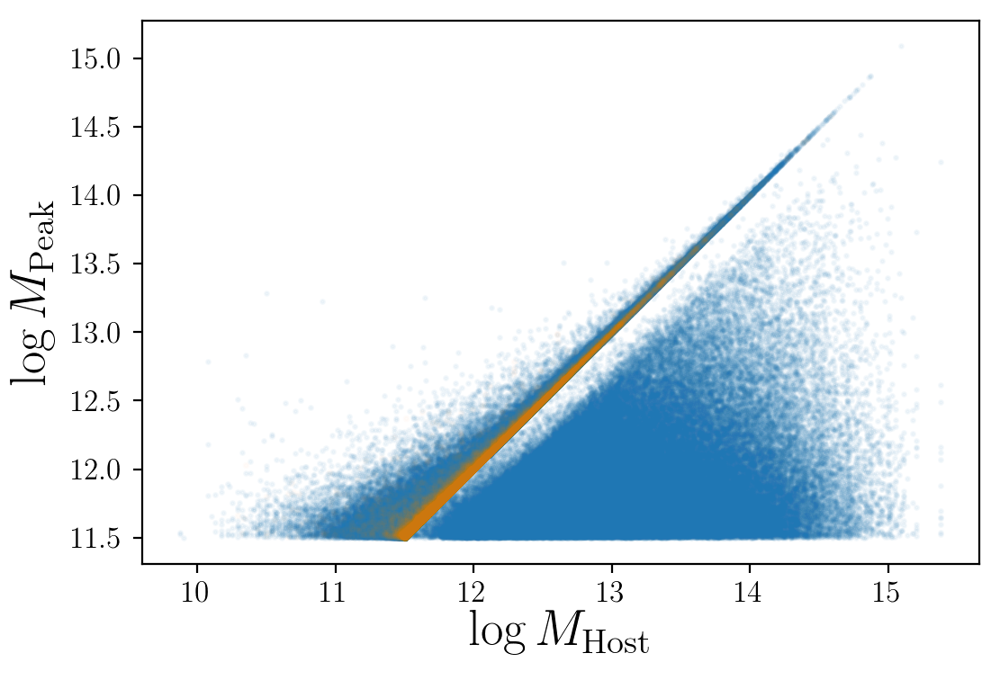

In [8]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            500000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            20000, replace=False)

plt.scatter(um2.um_mock['logmh_host'][random_1], 
            um2.um_mock['logmh_peak'][random_1], 
            s=2, alpha=0.05, rasterized=True);

plt.scatter(mock_cen['logmh_host'][random_2], 
            mock_cen['logmh_peak'][random_2], 
            s=3, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\mathrm{Host}}$', size=20); 
plt.ylabel(r'$\log M_{\mathrm{Peak}}$', size=20); 

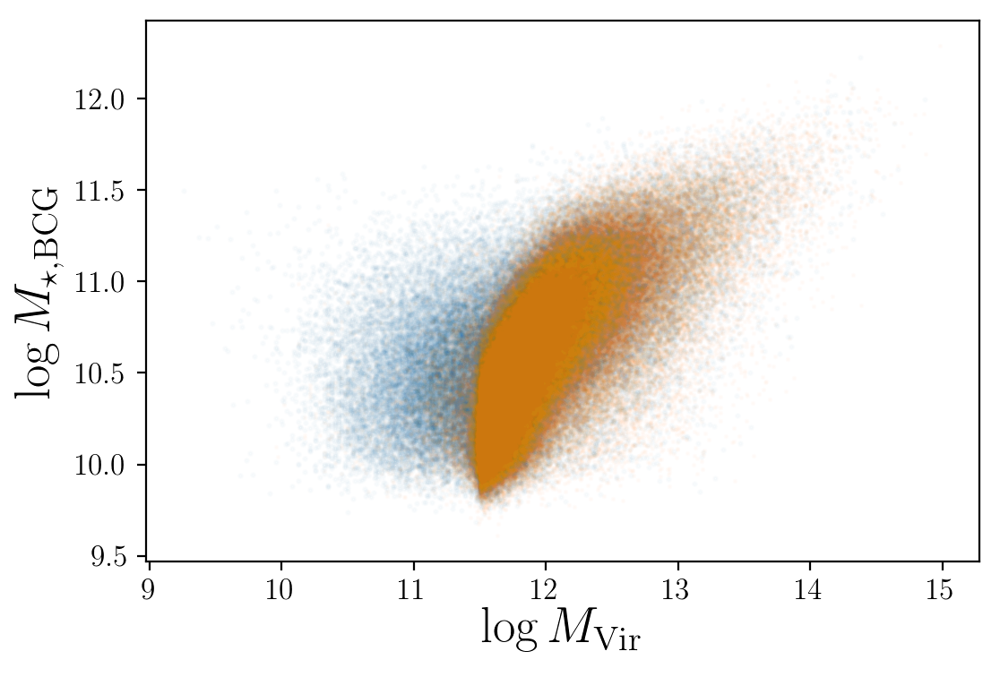

In [13]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logmh_vir'][random_1], 
            um2.um_mock['logms_gal'][random_1], 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logmh_vir'][random_2], 
            mock_cen['logms_gal'][random_2], 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\mathrm{Vir}}$', size=20); 
plt.ylabel(r'$\log M_{\star,\mathrm{BCG}}$', size=20); 

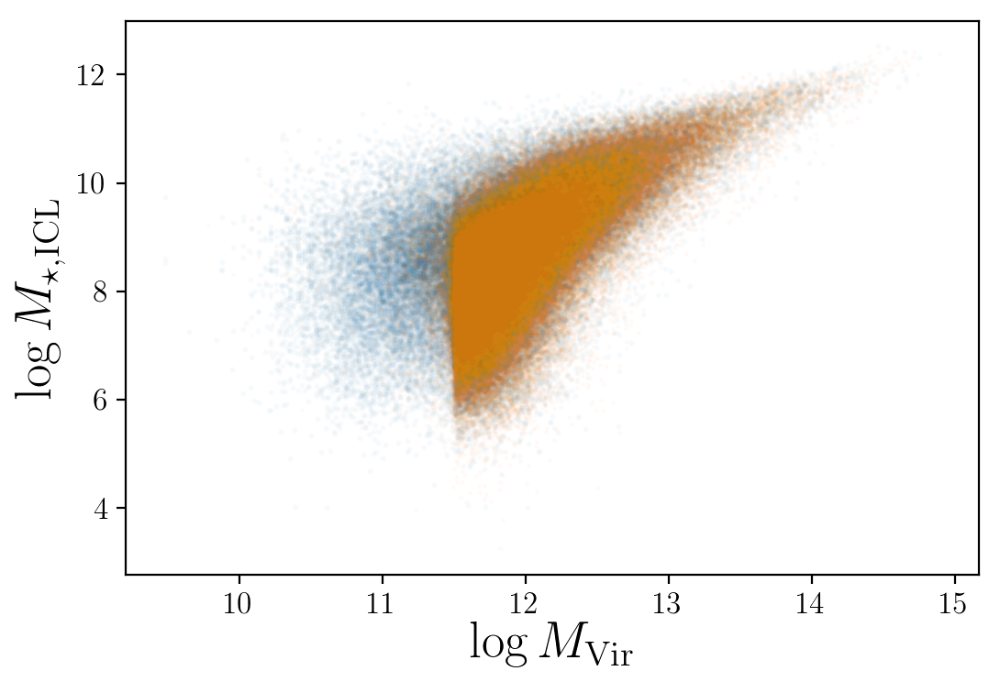

In [14]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logmh_vir'][random_1], 
            um2.um_mock['logms_icl'][random_1], 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logmh_vir'][random_2], 
            mock_cen['logms_icl'][random_2], 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\mathrm{Vir}}$', size=20); 
plt.ylabel(r'$\log M_{\star,\mathrm{ICL}}$', size=20); 

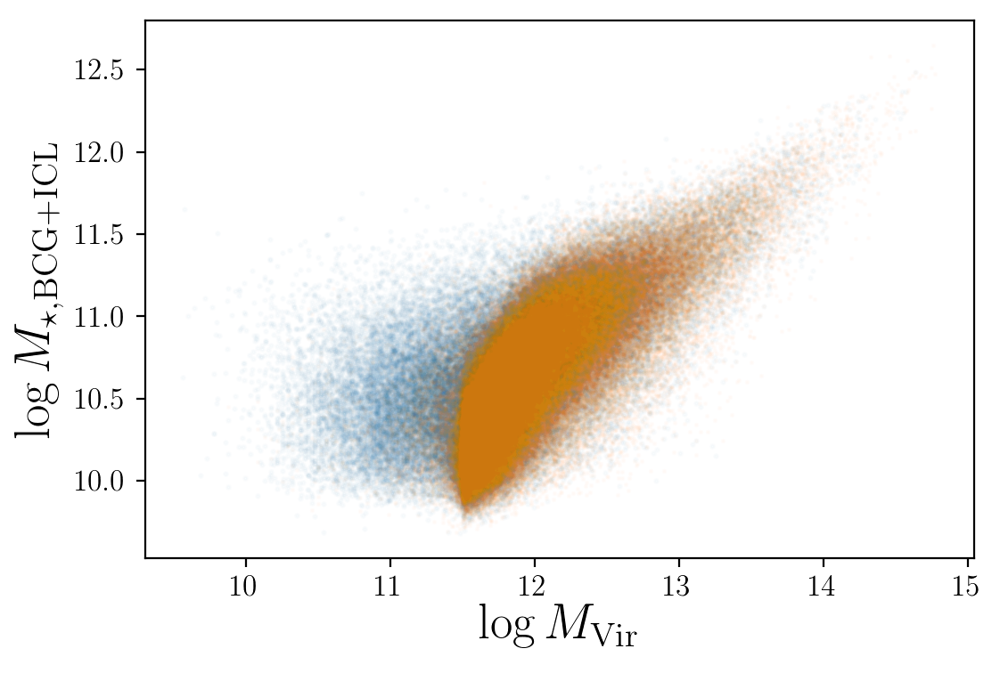

In [15]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logmh_vir'][random_1], 
            um2.um_mock['logms_tot'][random_1], 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logmh_vir'][random_2], 
            mock_cen['logms_tot'][random_2], 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\mathrm{Vir}}$', size=20); 
plt.ylabel(r'$\log M_{\star,\mathrm{BCG+ICL}}$', size=20); 

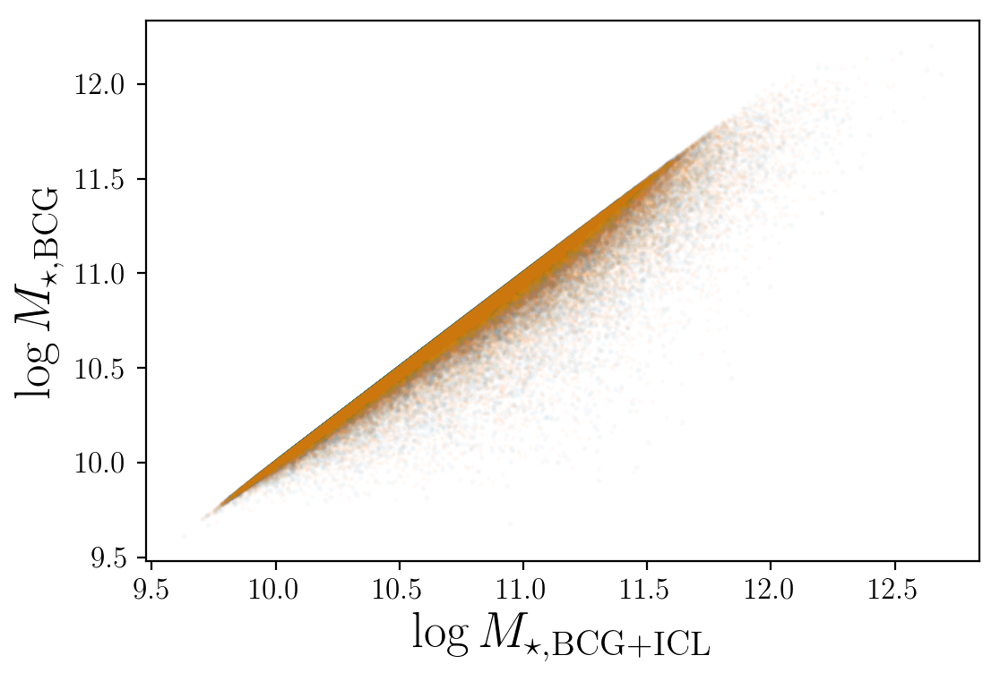

In [16]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logms_tot'][random_1], 
            um2.um_mock['logms_gal'][random_1], 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logms_tot'][random_2], 
            mock_cen['logms_gal'][random_2], 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\star, \mathrm{BCG+ICL}}$', size=20); 
plt.ylabel(r'$\log M_{\star, \mathrm{BCG}}$', size=20); 

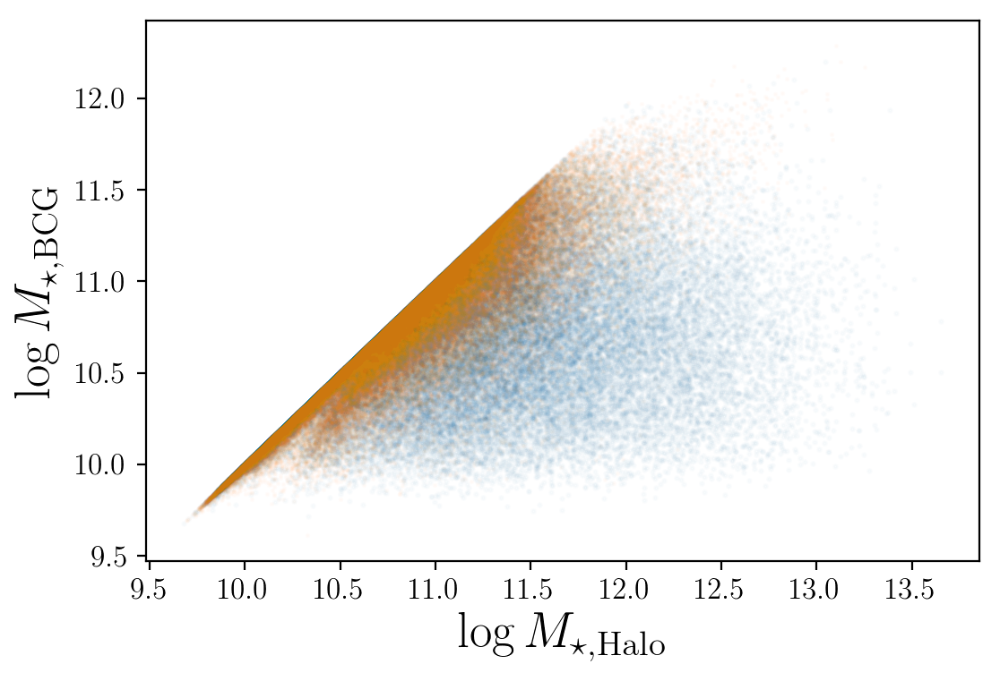

In [23]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logms_halo'][random_1], 
            um2.um_mock['logms_gal'][random_1], 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logms_halo'][random_2], 
            mock_cen['logms_gal'][random_2], 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\star, \mathrm{Halo}}$', size=20); 
plt.ylabel(r'$\log M_{\star, \mathrm{BCG}}$', size=20); 

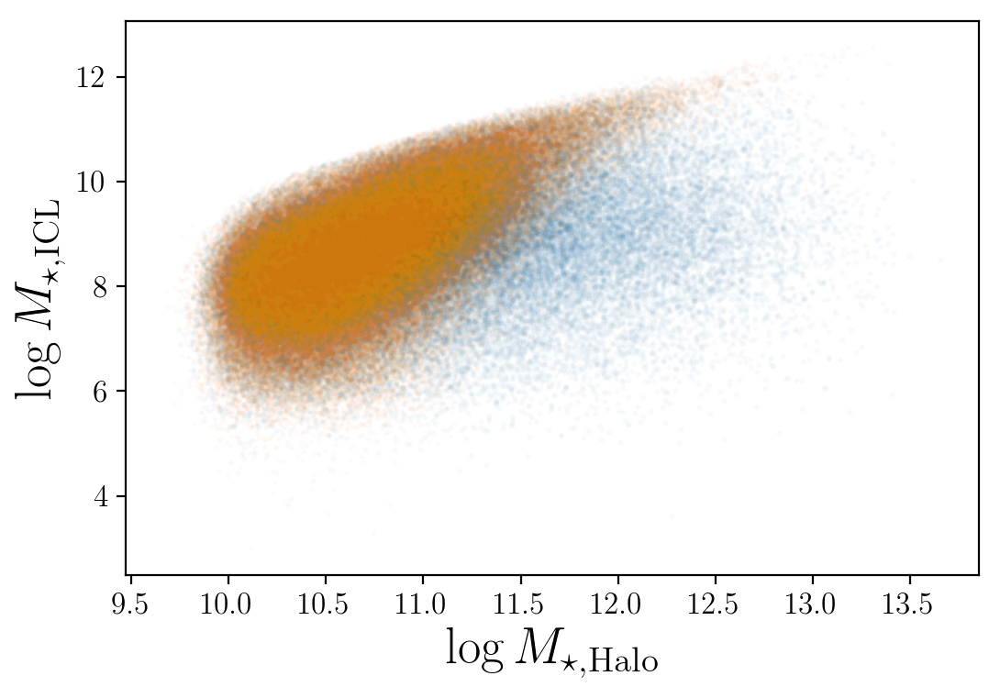

In [24]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logms_halo'][random_1], 
            um2.um_mock['logms_icl'][random_1], 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logms_halo'][random_2], 
            mock_cen['logms_icl'][random_2], 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\star, \mathrm{Halo}}$', size=20); 
plt.ylabel(r'$\log M_{\star, \mathrm{ICL}}$', size=20); 

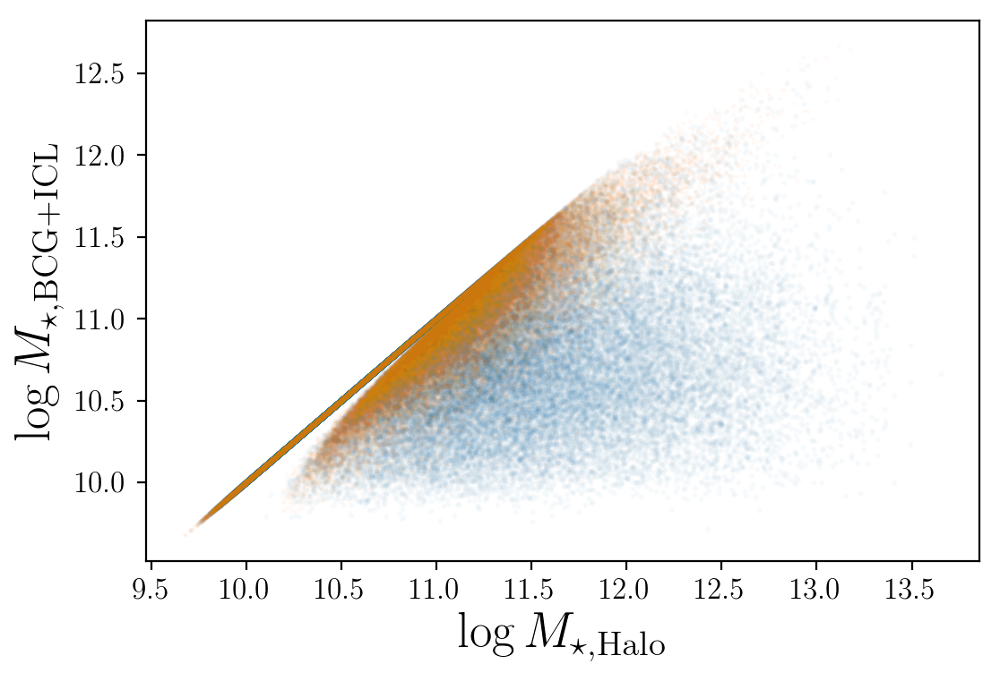

In [25]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logms_halo'][random_1], 
            um2.um_mock['logms_tot'][random_1], 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logms_halo'][random_2], 
            mock_cen['logms_tot'][random_2], 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\star, \mathrm{Halo}}$', size=20); 
plt.ylabel(r'$\log M_{\star, \mathrm{BCG+ICL}}$', size=20); 

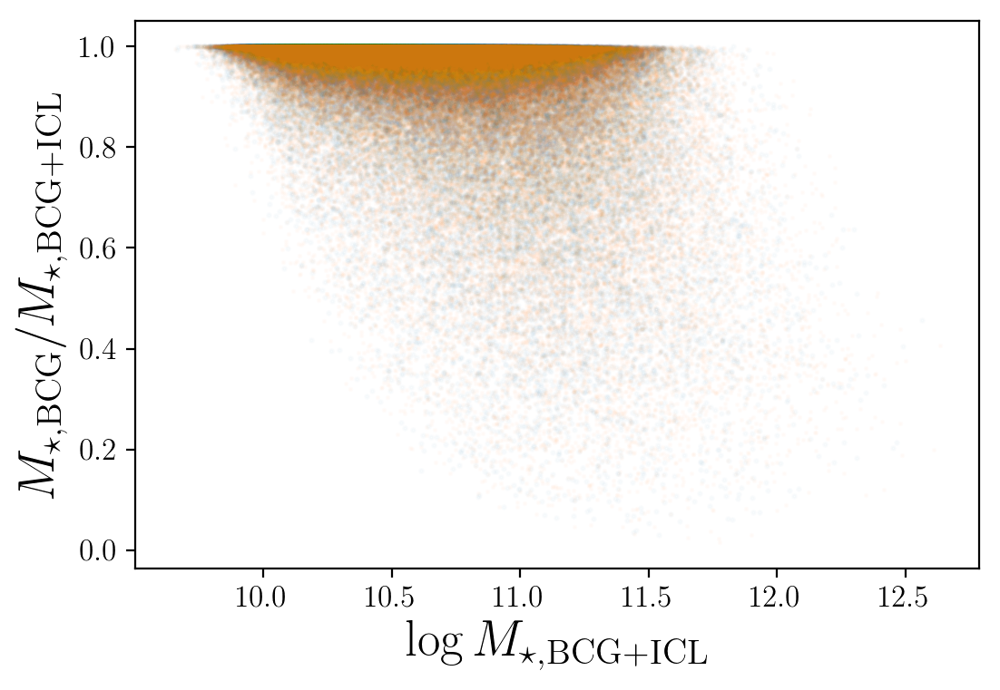

In [20]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logms_tot'][random_1], 
            (10.0 ** um2.um_mock['logms_gal'][random_1] / 
             10.0 ** um2.um_mock['logms_tot'][random_1]), 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logms_tot'][random_2], 
            (10.0 ** mock_cen['logms_gal'][random_2] /
             10.0 ** mock_cen['logms_tot'][random_2]), 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\star, \mathrm{BCG+ICL}}$', size=20); 
plt.ylabel(r'$M_{\star, \mathrm{BCG}}/M_{\star, \mathrm{BCG+ICL}}$', size=20); 

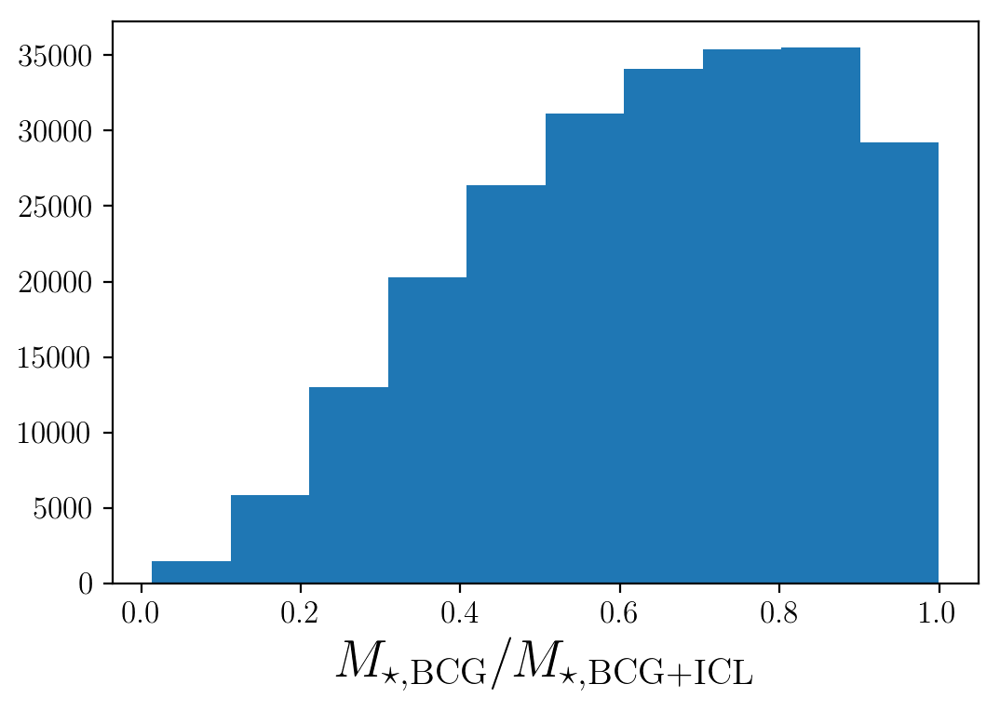

In [52]:
mock_cen = um2.um_mock[um2.mask_central]
frac_bcg_cen = (10.0 ** mock_cen['logms_gal'] /
                10.0 ** mock_cen['logms_tot'])

mass_mask = (mock_cen['logms_tot'] >= 11.4) & (mock_cen['logmh_vir'] > 13.0)

hh = plt.hist(frac_bcg_cen[mass_mask]);
plt.xlabel(r'$M_{\star, \mathrm{BCG}}/M_{\star, \mathrm{BCG+ICL}}$', size=20);
#plt.text(0.05, 100000, r'$\log M_{\star, \mathrm{BCG+ICL}} > 11.4$', fontsize=25)

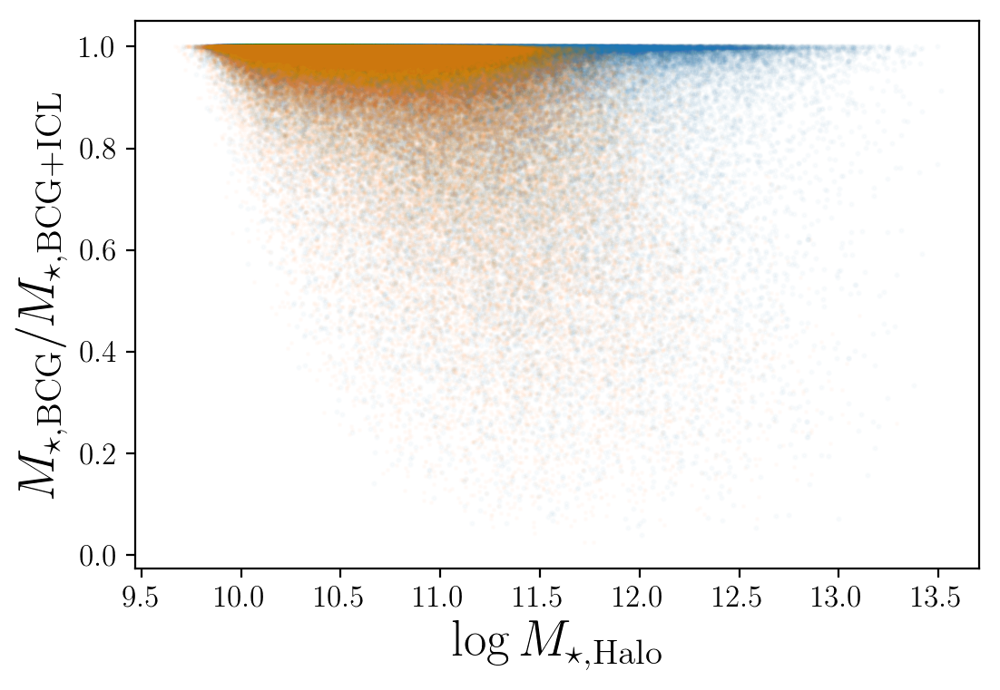

In [22]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logms_halo'][random_1], 
            (10.0 ** um2.um_mock['logms_gal'][random_1] / 
             10.0 ** um2.um_mock['logms_tot'][random_1]), 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logms_halo'][random_2], 
            (10.0 ** mock_cen['logms_gal'][random_2] /
             10.0 ** mock_cen['logms_tot'][random_2]), 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\star, \mathrm{Halo}}$', size=20); 
plt.ylabel(r'$M_{\star, \mathrm{BCG}}/M_{\star, \mathrm{BCG+ICL}}$', size=20); 

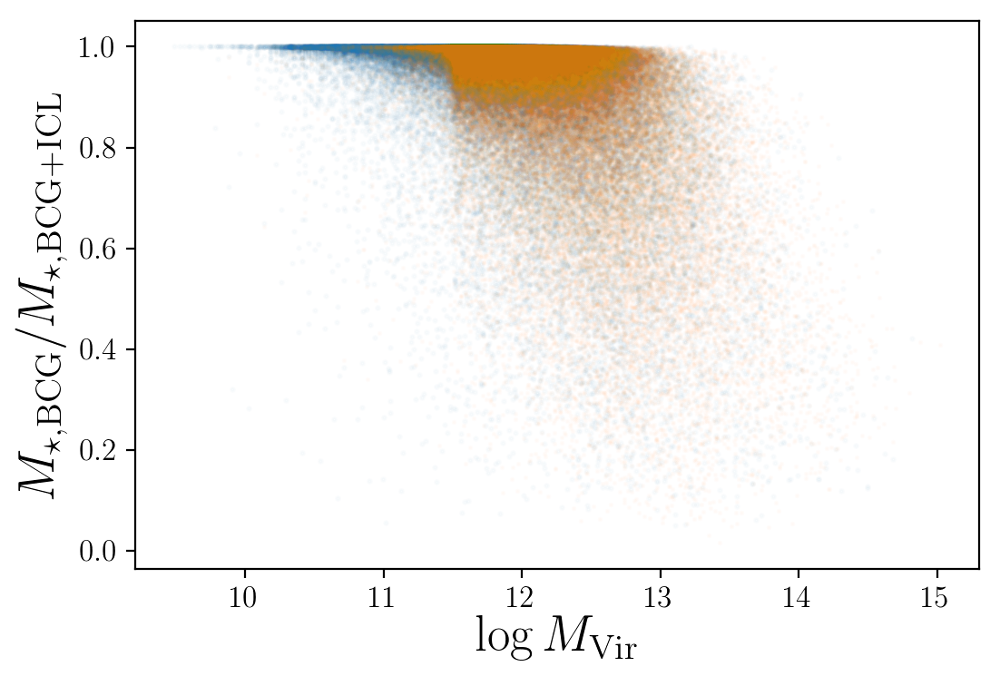

In [21]:
mock_cen = um2.um_mock[um2.mask_central]

random_1 = np.random.choice(np.arange(len(um2.um_mock)), 
                            100000, replace=False)
random_2 = np.random.choice(np.arange(len(mock_cen)), 
                            200000, replace=False)

plt.scatter(um2.um_mock['logmh_vir'][random_1], 
            (10.0 ** um2.um_mock['logms_gal'][random_1] / 
             10.0 ** um2.um_mock['logms_tot'][random_1]), 
            s=2, alpha=0.02, rasterized=True);

plt.scatter(mock_cen['logmh_vir'][random_2], 
            (10.0 ** mock_cen['logms_gal'][random_2] /
             10.0 ** mock_cen['logms_tot'][random_2]), 
            s=1, alpha=0.02, rasterized=True);

plt.xlabel(r'$\log M_{\mathrm{Vir}}$', size=20); 
plt.ylabel(r'$M_{\star, \mathrm{BCG}}/M_{\star, \mathrm{BCG+ICL}}$', size=20); 

## Save the value-added halo catalog 

In [5]:
um2.um_mock.write('Data/UM2_multidark_mock_value_added_mpeak_11.5.fits', format='fits', 
                  overwrite=True)

## Save the pre-computed lensing pairs

In [6]:
precompute_mass_binary = "Data/multidark_rockstar_halotools_v0p4_a0.7333_precompute_mpeak_11.5_20bins"

np.savez(precompute_mass_binary, data=um2.um_mass_encl)

## Fit the default UM2 Mhalo-Ms,halo relation

In [7]:
shmr_a, shmr_b = um2.mockFitSimpleSHMR(um_min_mvir=13.6)

# Use 67681 galaxies for the fitting...
# SHMR : logms_halo = 0.8864 x logmh_vir + -0.0365


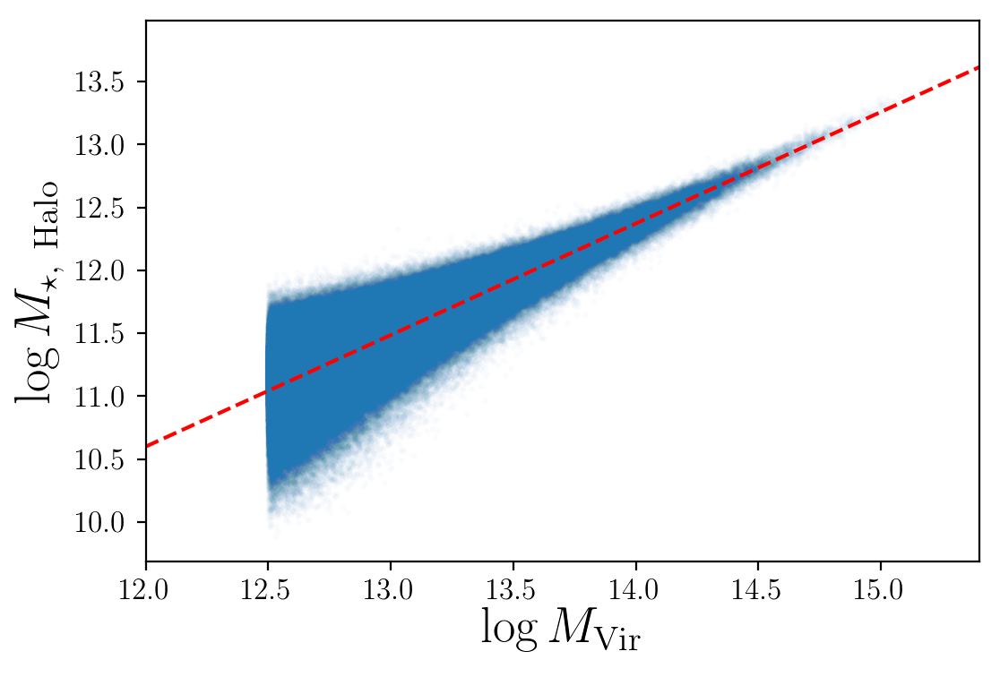

In [9]:
# Visualize the best-fit relation
mh_arr = np.linspace(12.0, 15.6, 50)
plt.scatter(um.um_mock['logmh_vir'][um.mask_central], 
            um.um_mock['logms_halo'][um.mask_central],
            s=3, alpha=0.01, rasterized=True);

plt.plot(mh_arr, (shmr_a * mh_arr + shmr_b), linestyle='--', 
         c='r');
plt.xlabel(r'$\log M_{\mathrm{Vir}}$', size=20); 
plt.ylabel(r'$\log M_{\star,\ \mathrm{Halo}}$', size=20);
plt.xlim(12.0, 15.4);

## Fit the default UM2 Mhalo-sigma(Ms) relation

# Mh-SigMs : Sig(logms_halo) = -0.0757 x logmh_vir + 1.1822


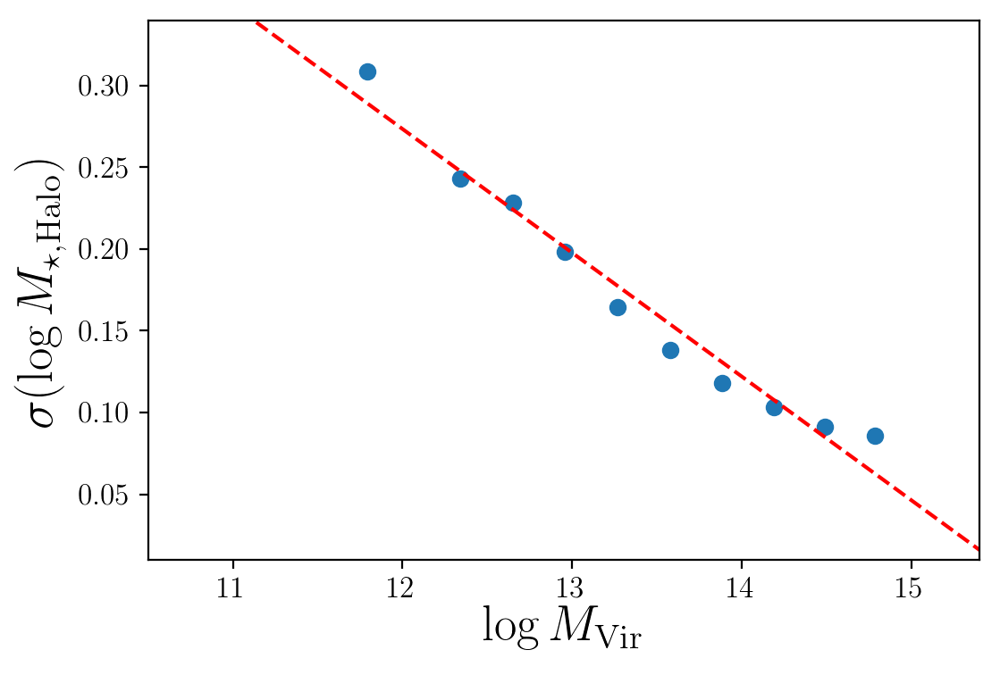

In [8]:
sigms_a, sigms_b, mh_bin, sig_bin = um2.mockFitSimpleMhScatter(um_min_mvir=12.2)

# Visualize the results
mh_arr = np.linspace(10.0, 15.6, 50)
plt.scatter(mh_bin, sig_bin)
plt.plot(mh_arr, (sigms_a * mh_arr + sigms_b), 
         c='r', linestyle='--')

plt.xlabel(r'$\log M_{\mathrm{Vir}}$', size=20); 
plt.ylabel(r'$\sigma(\log M_{\star, \mathrm{Halo}})$', size=20);
plt.xlim(10.5, 15.4);
plt.ylim(0.01, 0.34);

## LOESS fit to Mhalo-Mtot-M_ICL plane

In [20]:
# --------------------------------------------------------------------------------------- #
mock_cen = copy.deepcopy(um2.um_mock[um2.mask_central])
mock_massive = mock_cen[((mock_cen['logms_tot'] > 11.4) & 
                         (mock_cen['logms_gal'] > 10.8) & 
                         (mock_cen['logmh_vir'] < 15.0) & 
                         (mock_cen['logmh_vir'] > 12.4))]
print(len(mock_massive), len(mock_cen))

random_index = np.random.choice(np.arange(len(mock_massive)), 
                                50000, replace=False)

(362978, 4914559)


In [21]:
xx = np.asarray(mock_massive[random_index]['logms_tot'])
yy = np.asarray(mock_massive[random_index]['logms_gal'])
zz = np.asarray(mock_massive[random_index]['logmh_vir'])
sigz = zz * 0.0 + 0.03
zout, wout = loess_2d(xx, yy, zz, 
                      degree=1, sigz=sigz)
# --------------------------------------------------------------------------------------- #

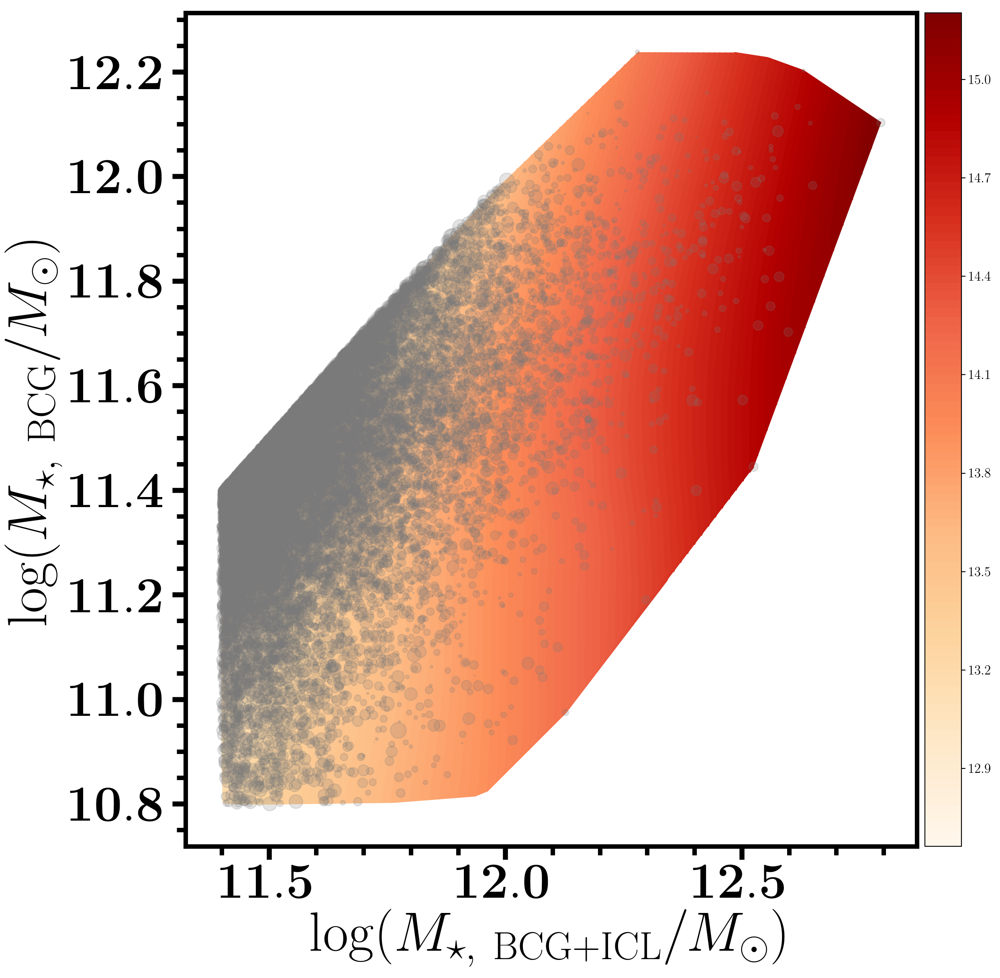

In [22]:
xtickFormat='$\mathbf{%4.1f}$'
ytickFormat='$\mathbf{%4.1f}$'

ORG = plotting.ORG
BLK = plotting.BLK

# --------------------------------------------------------------------------------------- #
fig = plt.figure(figsize=(12, 12))
fig.subplots_adjust(left=0.19, right=0.995, 
                    bottom=0.13, top=0.995,
                    wspace=0.00, hspace=0.00)
# --------------------------------------------------------------------------------------- #

ax1 = fig.add_subplot(111)
ax1 = plotting.songAxisSetup(ax1, ylabel=45, xlabel=45, border=4.0, 
                             xtickFormat=xtickFormat, ytickFormat=ytickFormat)


# --------------------------------------------------------------------------------------- #
xShow, yShow, zShow = map(np.ravel, [xx, yy, zout])
zMin, zMax = np.nanmin(zShow), np.nanmax(zShow)
nColors = 100
nTicks = 10
cLevels = np.linspace(zMin, zMax, nColors)

zContour = ax1.tricontourf(xShow, yShow, zShow, levels=cLevels, 
                           cmap=ORG, extend='neither')
for c in zContour.collections:    # Remove white gaps in contour levels of PDF
    c.set_edgecolor("face")       # http://stackoverflow.com/a/32911283/
    
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
cTicks = MaxNLocator(nTicks).tick_values(zMin, zMax)
cbar = plt.colorbar(zContour, cax=cax, ticks=cTicks)
cbar.solids.set_edgecolor("face")  # Remove gaps in PDF http://stackoverflow.com/a/15021541
# --------------------------------------------------------------------------------------- #

ax1.scatter(xx, yy, marker='o',
            s=(zout - zz) * 200,
            c=BLK(0.6), alpha=0.2, rasterized=True)

ax1.set_xlabel('$\log (M_{\star,\ \mathrm{BCG + ICL}}/M_{\odot})$', size=50)
ax1.set_ylabel('$\log (M_{\star,\ \mathrm{BCG}}/M_{\odot})$', size=50)

#ax1.text(11.15, 11.70, r'$\mathrm{Color\ and\ Marker Size:}$', size=40)
#ax1.text(11.15, 11.62, r'$\log (M_{\star,\ \mathrm{Halo}}/M_{\odot})$', size=40)

# --------------------------------------------------------------------------------------- #
## X, Y limits
#ax1.set_xlim(11.1, 12.59)
#ax1.set_ylim(10.7, 11.99)

#legend = ax1.legend(loc='upper left', shadow=True, fontsize=30)

#fig.savefig('mblack2_m100_m10_z0.30_loess.pdf', dpi=80)

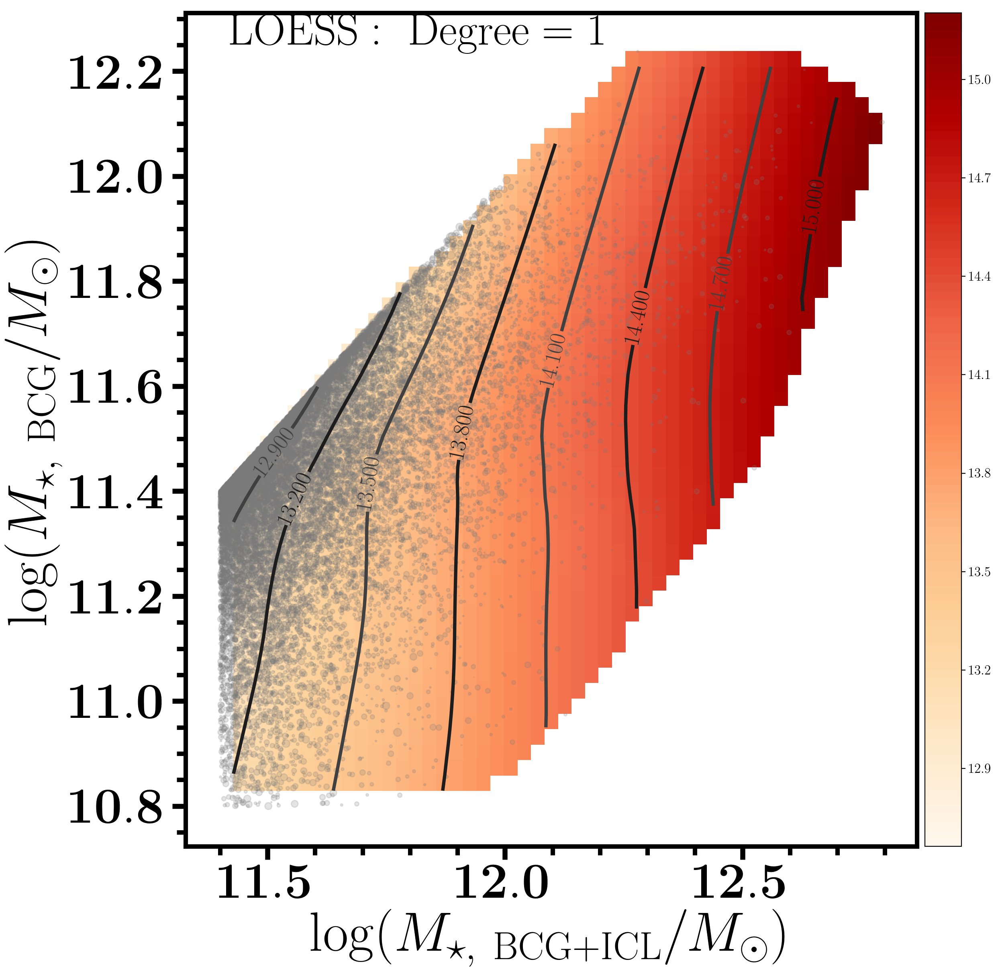

In [23]:
xtickFormat='$\mathbf{%4.1f}$'
ytickFormat='$\mathbf{%4.1f}$'

ORG = plotting.ORG
BLK = plotting.BLK

nColors = 100
nTicks = 10

# --------------------------------------------------------------------------------------- #
fig = plt.figure(figsize=(12, 12))
fig.subplots_adjust(left=0.19, right=0.995, 
                    bottom=0.13, top=0.995,
                    wspace=0.00, hspace=0.00)
# --------------------------------------------------------------------------------------- #

ax1 = fig.add_subplot(111)
ax1 = plotting.songAxisSetup(ax1, ylabel=45, xlabel=45, border=4.0, 
                             xtickFormat=xtickFormat, ytickFormat=ytickFormat)


# --------------------------------------------------------------------------------------- #
xMin, xMax = np.nanmin(xx), np.nanmax(xx)
yMin, yMax = np.nanmin(yy), np.nanmax(yy)
zMin, zMax = np.nanmin(zout), np.nanmax(zout)
cLevels = np.linspace(zMin, zMax, nColors)
xi = np.linspace(xMin, xMax, 50)
yi = np.linspace(yMin, yMax, 50)
import matplotlib.mlab as ml
zi = ml.griddata(xx, yy, zout, xi, yi)

CS1 = ax1.contour(xi, yi, zi, 8, linewidths=3.0, 
                  colors=[BLK(0.8), BLK(0.9)], 
                  extend='neither')
ax1.clabel(CS1, inline=1, fontsize=20)

CM = ax1.pcolormesh(xi, yi, zi, cmap=ORG)

for c in zContour.collections:    # Remove white gaps in contour levels of PDF
    c.set_edgecolor("face")       # http://stackoverflow.com/a/32911283/

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
cTicks = MaxNLocator(nTicks).tick_values(zMin, zMax)
cbar = plt.colorbar(zContour, cax=cax, ticks=cTicks)
cbar.solids.set_edgecolor("face")  # Remove gaps in PDF http://stackoverflow.com/a/15021541
# --------------------------------------------------------------------------------------- #

ax1.scatter(xx, yy, marker='o',
            s=(zout - zz) * 50,
            c=BLK(0.6), alpha=0.2, rasterized=True)

ax1.set_xlabel('$\log (M_{\star,\ \mathrm{BCG + ICL}}/M_{\odot})$', size=50)
ax1.set_ylabel('$\log (M_{\star,\ \mathrm{BCG}}/M_{\odot})$', size=50)

ax1.text(11.42, 12.25, r'$\mathrm{LOESS:\ Degree=1}$', size=40)

#ax1.text(11.15, 11.62, r'$\log (M_{\star,\ \mathrm{Halo}}/M_{\odot})$', size=40)

# --------------------------------------------------------------------------------------- #
## X, Y limits
#ax1.set_xlim(11.1, 12.59)
#ax1.set_ylim(10.7, 11.99)

#legend = ax1.legend(loc='upper left', shadow=True, fontsize=30)

#fig.savefig('mblack2_m100_m10_z0.30_loess.pdf', dpi=80)

# SMF with the photo-z + spec-z sample, and using logMmax

In [6]:
kwargs = {'obs_wl_sample' : 's16a_m100_m10_boxbin',
          'obs_smf_full' : 's82_total_smf_z0.15_0.43.fits',
          'obs_cat' : 's16a_wide_massive_fastlane_pzbright_short_170623.fits',
          'obs_smf_tot_max' : 12.2,
          'obs_mtot_col' : 'logm_100',
          'mcmc_nsamples' : 200,
          'mcmc_nburnin' : 200,
          'mcmc_nwalkers' : 200,
          'mcmc_smf_only' : False,
          'mcmc_wl_only' : False,
          'mcmc_wl_weight' : 1.0,
          'sim_cosmo' : Planck15,
          'um_cat' : 'UM2_multidark_mock_value_added_mpeak_11.5.fits',
          'um_wlcat' : 'multidark_rockstar_halotools_v0p4_a0.7333_precompute_mpeak_11.5_20bins.npz',
         }

um2 = UMMassProfModel(verbose=True, **kwargs)

# Input stellar mass catalog: s16a_wide_massive_fastlane_pzbright_short_170623.fits
# Input weak lensing profile sample: s16a_m100_m10_boxbin
# There are 19 weak lensing profiles in this sample
# Pre-computed full SMF: s82_total_smf_z0.15_0.43.fits
# The volume of the HSC data is     80672371.33 Mpc^3
# Using logm_10 as proxy of inner stellar mass.
# Using logm_100 as proxy of total stellar mass.
# For inner stellar mass: 
    11 bins at 10.80 < logMinn < 11.90
# For total stellar mass: 
    8 bins at 11.60 < logMtot < 12.20
# The volume of the UniverseMachine mock is   2915451895.04 Mpc^3
#-----------------------------------------------
#   Read in prepared mock catalog 
#-----------------------------------------------
#   Read in the pre-compute lensing pairs 


In [9]:
um2.obs_smf_tot.write('Data/s16a_massive_fastlane_pzbright_logm100_smf_default.fits')
um2.obs_smf_inn.write('Data/s16a_massive_fastlane_pzbright_logm10_smf_default.fits')

In [12]:
kwargs = {'obs_wl_sample' : 's16a_m100_m10_boxbin',
          'obs_smf_full' : 's82_total_smf_z0.15_0.43.fits',
          'obs_cat' : 's16a_wide_massive_fastlane_pzbright_short_170623.fits',
          'obs_smf_tot_max' : 12.3,
          'obs_mtot_col' : 'logm_max',
          'mcmc_nsamples' : 200,
          'mcmc_nburnin' : 200,
          'mcmc_nwalkers' : 200,
          'mcmc_smf_only' : False,
          'mcmc_wl_only' : False,
          'mcmc_wl_weight' : 1.0,
          'sim_cosmo' : Planck15,
          'um_cat' : 'UM2_multidark_mock_value_added_mpeak_11.5.fits',
          'um_wlcat' : 'multidark_rockstar_halotools_v0p4_a0.7333_precompute_mpeak_11.5_20bins.npz',
         }

um2 = UMMassProfModel(verbose=True, **kwargs)

# Input stellar mass catalog: s16a_wide_massive_fastlane_pzbright_short_170623.fits
# Input weak lensing profile sample: s16a_m100_m10_boxbin
# There are 19 weak lensing profiles in this sample
# Pre-computed full SMF: s82_total_smf_z0.15_0.43.fits
# The volume of the HSC data is     80672371.33 Mpc^3
# Using logm_10 as proxy of inner stellar mass.
# Using logm_max as proxy of total stellar mass.
# For inner stellar mass: 
    11 bins at 10.80 < logMinn < 11.90
# For total stellar mass: 
    8 bins at 11.60 < logMtot < 12.30
# The volume of the UniverseMachine mock is   2915451895.04 Mpc^3
#-----------------------------------------------
#   Read in prepared mock catalog 
#-----------------------------------------------
#   Read in the pre-compute lensing pairs 


In [14]:
um2.obs_smf_tot.write('Data/s16a_massive_fastlane_pzbright_logmMax_smf_default.fits')

# Test the model prediction

In [2]:
kwargs = {'obs_wl_sample' : 's16a_m100_m10_boxbin',
          'obs_smf_inn' : 's16a_massive_fastlane_pzbright_logm10_smf_default.fits',
          'obs_smf_tot' : 's16a_massive_fastlane_pzbright_logm100_smf_default.fits',
          'obs_smf_full' : 's82_total_smf_z0.15_0.43.fits',
          'mcmc_nsamples' : 200,
          'mcmc_nburnin' : 200,
          'mcmc_nwalkers' : 200,
          'mcmc_smf_only' : False,
          'mcmc_wl_only' : False,
          'mcmc_wl_weight' : 1.0,
          'sim_cosmo' : Planck15,
          'um_cat' : 'UM2_multidark_mock_value_added_mpeak_11.5.fits',
          'um_wlcat' : 'multidark_rockstar_halotools_v0p4_a0.7333_precompute_mpeak_11.5_20bins.npz',
          'um_min_scatter' : 0.00
         }

um2 = UMMassProfModel(verbose=True, **kwargs)

# Input stellar mass catalog: s16a_wide_massive_fastlane_short_170610.fits
# Input weak lensing profile sample: s16a_m100_m10_boxbin
# There are 19 weak lensing profiles in this sample
# Pre-computed SMF for inner logMs: s16a_massive_fastlane_pzbright_logm10_smf_default.fits
# Pre-computed SMF for total logMs: s16a_massive_fastlane_pzbright_logm100_smf_default.fits
# Pre-computed full SMF: s82_total_smf_z0.15_0.43.fits
# The volume of the HSC data is     80672371.33 Mpc^3
# Using logm_10 as proxy of inner stellar mass.
# Using logm_100 as proxy of total stellar mass.
# For inner stellar mass: 
    11 bins at 10.80 < logMinn < 11.90
# For total stellar mass: 
    8 bins at 11.60 < logMtot < 12.20
# The volume of the UniverseMachine mock is   2915451895.04 Mpc^3
#-----------------------------------------------
#   Read in prepared mock catalog 
#-----------------------------------------------
#   Read in the pre-compute lensing pairs 


## Manually tweaked model

In [3]:
# Provide the model parameters
#shmr_a, shmr_b = 0.621, 3.38
#sigms_a, sigms_b = -0.08, 1.18

# A
#shmr_a, shmr_b = 0.619, 3.38
#sigms_a, sigms_b = -0.08, 1.21

# B
shmr_a, shmr_b = 0.618, 3.47
sigms_a, sigms_b = 0.00, 0.00

# Generate the model predictions
%time um_model = um2.umPredictModel(shmr_a, shmr_b, sigms_a, sigms_b, return_wl_mhalo=True)

/usr/local/lib/python2.7/site-packages/halotools/utils/inverse_transformation_sampling.py:123: UserWarning: npts_y = 42 is less than  npts_lookup_table = 1000.
Setting npts_lookup_table to 42
  "Setting npts_lookup_table to {0}".format(npts_y, npts_lookup_table))
/usr/local/lib/python2.7/site-packages/halotools/utils/inverse_transformation_sampling.py:123: UserWarning: npts_y = 44 is less than  npts_lookup_table = 1000.
Setting npts_lookup_table to 44
  "Setting npts_lookup_table to {0}".format(npts_y, npts_lookup_table))


CPU times: user 2.83 s, sys: 1.04 s, total: 3.87 s
Wall time: 3.91 s


In [43]:
import cProfile

cProfile.run('um2.umPredictModel(shmr_a, shmr_b, sigms_a, sigms_b, return_wl_mhalo=True)')

         502600 function calls (484485 primitive calls) in 8.420 seconds

   Ordered by: standard name

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.035    0.035    8.420    8.420 <string>:1(<module>)
     8574    0.029    0.000    0.067    0.000 _abcoll.py:548(update)
       38    0.000    0.000    0.000    0.000 _bsplines.py:17(prod)
       19    0.000    0.000    0.000    0.000 _bsplines.py:211(construct_fast)
       19    0.000    0.000    0.001    0.000 _bsplines.py:291(__call__)
       19    0.001    0.000    0.001    0.000 _bsplines.py:328(_evaluate)
       19    0.000    0.000    0.000    0.000 _bsplines.py:332(_ensure_c_contiguous)
       19    0.000    0.000    0.001    0.000 _bsplines.py:482(_not_a_knot)
       57    0.000    0.000    0.000    0.000 _bsplines.py:500(_as_float_array)
       19    0.001    0.000    0.005    0.000 _bsplines.py:510(make_interp_spline)
       38    0.000    0.000    0.011    0.000 _methods.py:31(_sum)
   

     4193    0.009    0.000    0.087    0.000 {method '__reduce_ex__' of 'object' objects}
       12    0.000    0.000    0.000    0.000 {method '__setslice__' of 'numpy.ndarray' objects}
      234    0.000    0.000    0.002    0.000 {method 'all' of 'numpy.ndarray' objects}
      117    0.000    0.000    0.002    0.000 {method 'any' of 'numpy.ndarray' objects}
    14191    0.005    0.000    0.005    0.000 {method 'append' of 'list' objects}
       99    0.015    0.000    0.022    0.000 {method 'argsort' of 'numpy.ndarray' objects}
      151    0.001    0.000    0.001    0.000 {method 'astype' of 'numpy.ndarray' objects}
       39    0.000    0.000    0.000    0.000 {method 'clear' of 'dict' objects}
     4193    0.002    0.000    0.002    0.000 {method 'copy' of 'dict' objects}
       41    0.000    0.000    0.000    0.000 {method 'copy' of 'numpy.ndarray' objects}
        1    0.000    0.000    0.000    0.000 {method 'disable' of '_lsprof.Profiler' objects}
       76    0.001    0.00

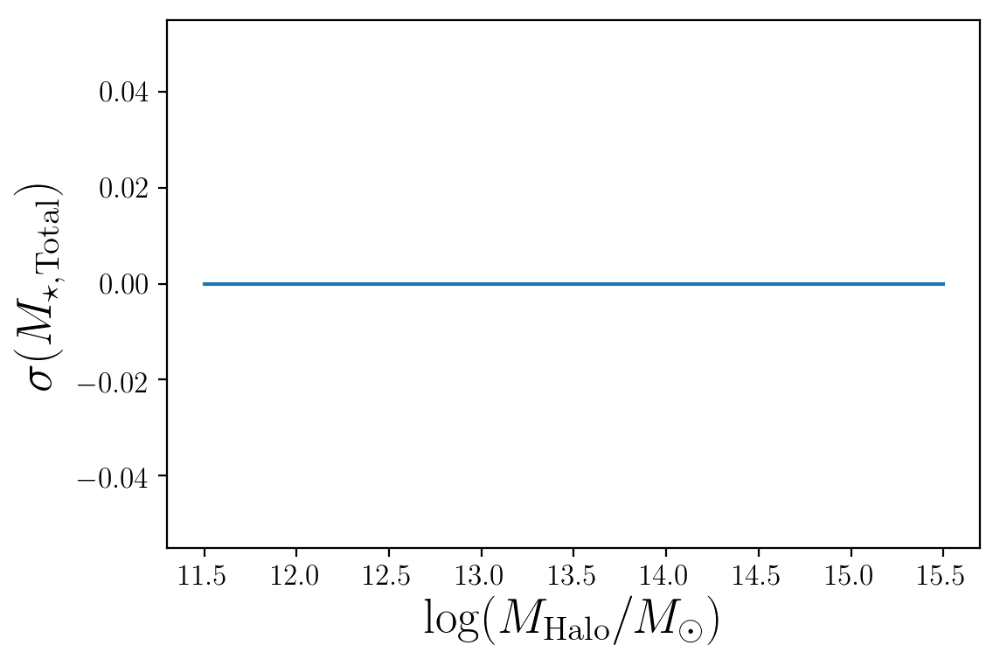

In [80]:
aa = np.linspace(11.5, 15.5, 50)
plt.plot(aa, um2.mockGetSimpleMhScatter(aa, sigms_a, sigms_b))

plt.xlabel(r'$\log (M_{\rm Halo}/M_{\odot})$', fontsize=20)
plt.ylabel(r'$\sigma(M_{\star, {\rm Total}})$', fontsize=20)

-673.326651435


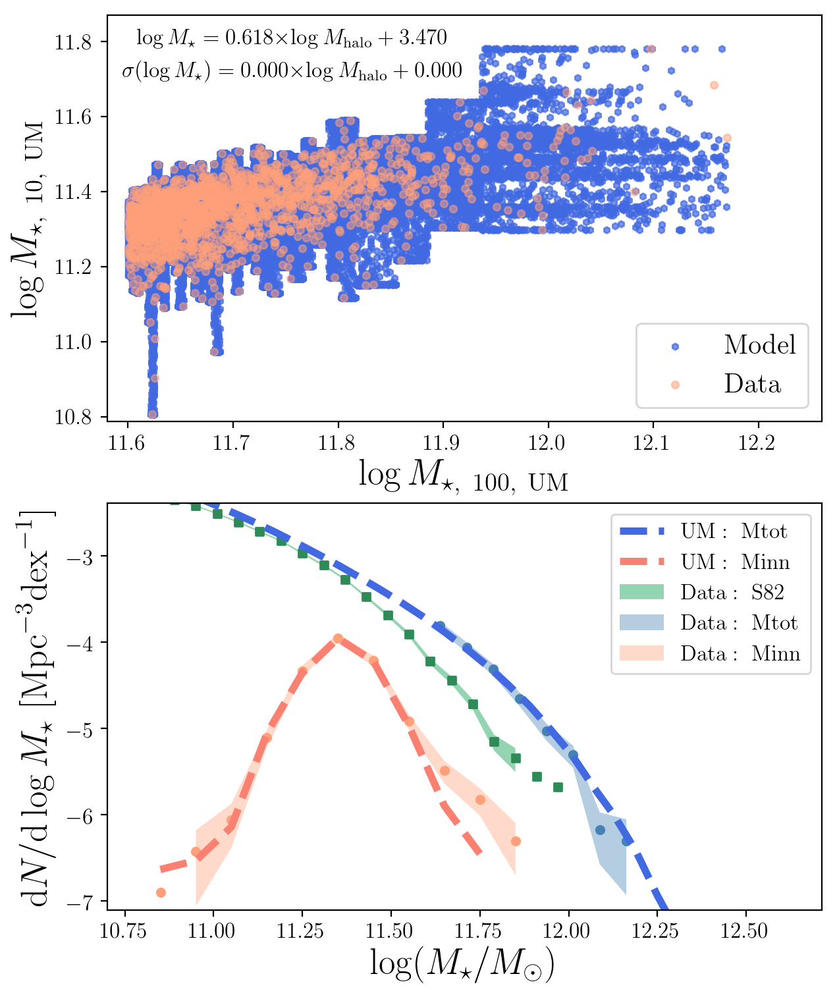

In [4]:
(um_smf_tot, um_smf_inn, um_wl_profs, 
 logms_mod_inn, logms_mod_tot_all, 
 logms_mod_halo_all, mask_mtot,
 um_wl_mhalo, mhalo) = um_model

logms_mod_tot = logms_mod_tot_all[mask_mtot]
logms_mod_halo = logms_mod_halo_all[mask_mtot]

logmh_vir = mhalo[mask_mtot]

frac_10 = (10.0 ** logms_mod_inn / 10.0 ** logms_mod_tot)

um_smf_tot_all = um2.computeSMF(logms_mod_tot_all,
                                um2.um_volume,
                                30, 10.60, 12.4,
                                bootstrap=False)

# logM100-logM10 and SMF plot
fig1 = um2.umPlotSMF(um_smf_tot_all, um_smf_inn, 
                     logms_mod_tot, logms_mod_inn,
                     shmr_a=shmr_a, shmr_b=shmr_b, 
                     sigms_a=sigms_a, sigms_b=sigms_b)

# Get the lnLikelihood
theta = (shmr_a, shmr_b, sigms_a, sigms_b)

lnlike_smf = um2.lnLike(theta)
print(lnlike_smf)

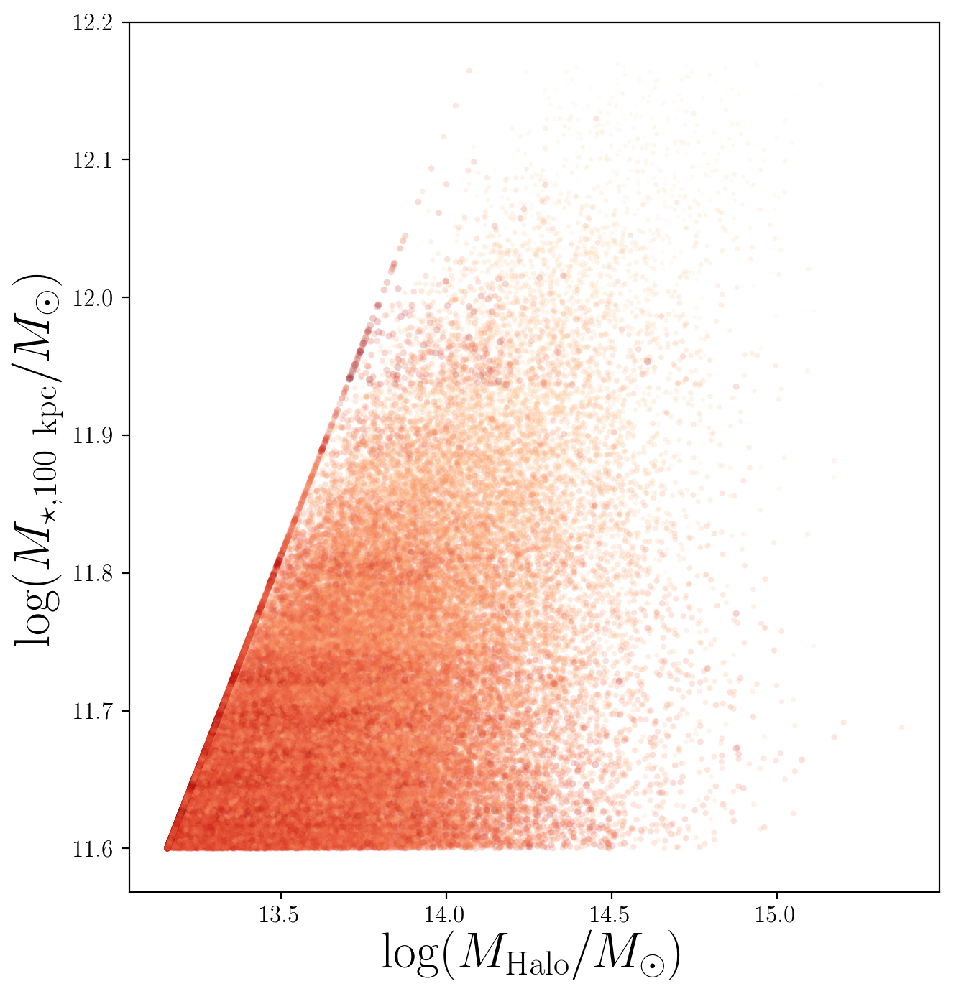

In [8]:
xx = logmh_vir
yy = logms_mod_tot
zz = frac_10

xtickFormat='$\mathbf{%4.1f}$'
ytickFormat='$\mathbf{%4.1f}$'

ORG = plotting.ORG
BLK = plotting.BLK

nColors = 100
nTicks = 10

# --------------------------------------------------------------------------------------- #
fig = plt.figure(figsize=(7, 7))
fig.subplots_adjust(left=0.19, right=0.995, 
                    bottom=0.13, top=0.995,
                    wspace=0.00, hspace=0.00)
# --------------------------------------------------------------------------------------- #
ax1 = fig.add_subplot(111)

## --------------------------------------------------------------------------------------- #
#xMin, xMax = np.nanmin(xx), np.nanmax(xx)
#yMin, yMax = np.nanmin(yy), np.nanmax(yy)
#zMin, zMax = np.nanmin(zz), np.nanmax(zz)
#cLevels = np.linspace(zMin, zMax, nColors)
#xi = np.linspace(xMin, xMax, 50)
#yi = np.linspace(yMin, yMax, 50)
#zi = ml.griddata(xx, yy, zz, xi, yi)

#CS1 = ax1.contour(xi, yi, zi, 4, linewidths=2.0, 
#                  colors=[BLK(0.8), BLK(0.9)], 
#                  extend='neither')
#ax1.clabel(CS1, inline=1, fontsize=20)

#CM = ax1.pcolormesh(xi, yi, zi, cmap=ORG)
# --------------------------------------------------------------------------------------- #

#ax1.plot(np.linspace(11.5, 15.5, 10), 
#         np.linspace(11.5, 15.5, 10), 
#         linestyle='--')

ax1.scatter(xx, yy, marker='o',
            s=(zz * 20), c=frac_10, 
            edgecolor='none',
            cmap=ORG, alpha=0.2, 
            rasterized=True)

ax1.set_xlabel(r'$\log (M_{{\rm Halo}}/M_{\odot})$', fontsize=25)
ax1.set_ylabel(r'$\log (M_{\star, {\rm 100\ kpc}}/M_{\odot})$', fontsize=25)

#ax1.text(11.80, 10.95, r'$\mathrm{LOESS:\ Degree=1}$', size=40)

In [ ]:
xx = logms_mod_halo
yy = logms_mod_tot
zz = frac_10

xtickFormat='$\mathbf{%4.1f}$'
ytickFormat='$\mathbf{%4.1f}$'

ORG = plotting.ORG
BLK = plotting.BLK

nColors = 100
nTicks = 10

# --------------------------------------------------------------------------------------- #
fig = plt.figure(figsize=(7, 7))
fig.subplots_adjust(left=0.19, right=0.995, 
                    bottom=0.13, top=0.995,
                    wspace=0.00, hspace=0.00)
# --------------------------------------------------------------------------------------- #
ax1 = fig.add_subplot(111)

# --------------------------------------------------------------------------------------- #
xMin, xMax = np.nanmin(xx), np.nanmax(xx)
yMin, yMax = np.nanmin(yy), np.nanmax(yy)
zMin, zMax = np.nanmin(zz), np.nanmax(zz)
cLevels = np.linspace(zMin, zMax, nColors)
xi = np.linspace(xMin, xMax, 50)
yi = np.linspace(yMin, yMax, 50)
zi = ml.griddata(xx, yy, zz, xi, yi)

CS1 = ax1.contour(xi, yi, zi, 4, linewidths=2.0, 
                  colors=[BLK(0.8), BLK(0.9)], 
                  extend='neither')
ax1.clabel(CS1, inline=1, fontsize=20)

CM = ax1.pcolormesh(xi, yi, zi, cmap=ORG)
# --------------------------------------------------------------------------------------- #

ax1.scatter(xx, yy, marker='.',
            s=(zz * 10),
            c=BLK(0.2), alpha=0.02, rasterized=True)

ax1.set_xlabel(r'$\log (M_{\star, {\rm Total}}/M_{\odot})$', fontsize=25)
ax1.set_ylabel(r'$\log (M_{\star, {\rm 100\ kpc}}/M_{\odot})$', fontsize=25)

#ax1.text(11.80, 10.95, r'$\mathrm{LOESS:\ Degree=1}$', size=40)

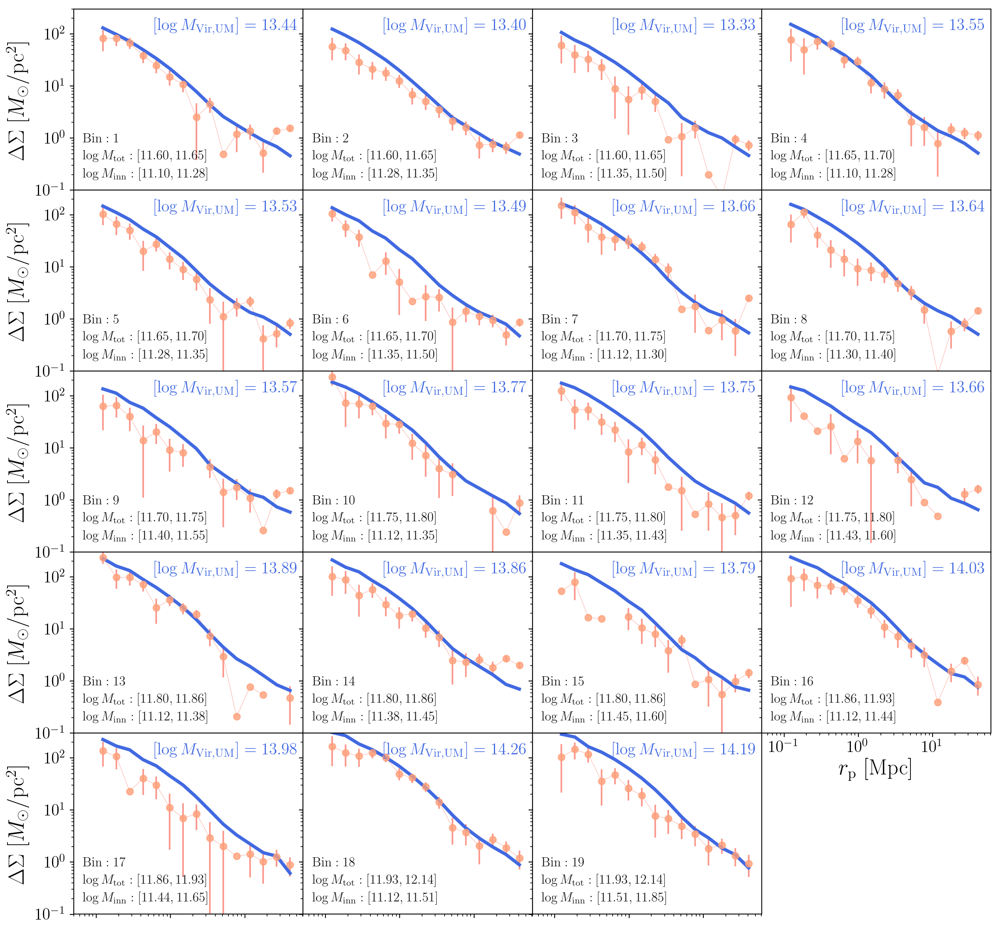

In [10]:
# WL profiles
fig2 = um2.umPlotWL(um_wl_profs, um_wl_mhalo=um_wl_mhalo)

In [5]:
random_index = np.random.choice(np.arange(len(logms_mod_inn)), 
                                10000, replace=False)
mock_massive = um2.um_mock[mask_mtot]

xx = np.asarray(logms_mod_tot[random_index])
yy = np.asarray(logms_mod_inn[random_index])
#zz = np.asarray(mock_massive[random_index]['logmh_vir'])
zz = np.asarray(logmh_vir[random_index])
sigz = zz * 0.0 + 0.02
zout, wout = loess_2d(xx, yy, zz, 
                      degree=1, sigz=sigz)
# --------------------------------------------------------------------------------------- #

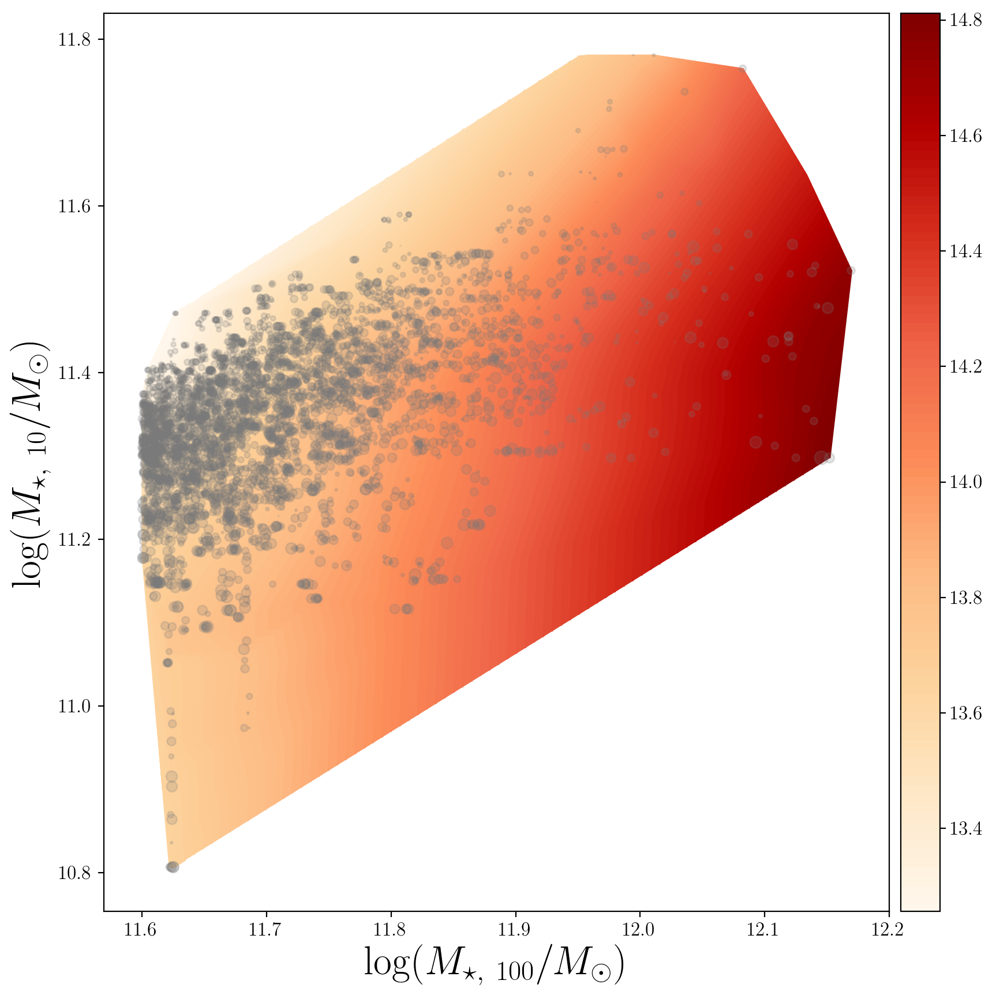

In [6]:
xtickFormat='$\mathbf{%4.1f}$'
ytickFormat='$\mathbf{%4.1f}$'

ORG = plotting.ORG
BLK = plotting.BLK

# --------------------------------------------------------------------------------------- #
fig = plt.figure(figsize=(9, 9))
fig.subplots_adjust(left=0.19, right=0.995, 
                    bottom=0.13, top=0.995,
                    wspace=0.00, hspace=0.00)
# --------------------------------------------------------------------------------------- #

ax1 = fig.add_subplot(111)
#ax1 = plotting.songAxisSetup(ax1, ylabel=45, xlabel=45, border=4.0, 
#                             xtickFormat=xtickFormat, ytickFormat=ytickFormat)


# --------------------------------------------------------------------------------------- #
xShow, yShow, zShow = map(np.ravel, [xx, yy, zout])
zMin, zMax = np.nanmin(zShow), np.nanmax(zShow)
nColors = 100
nTicks = 10
cLevels = np.linspace(zMin, zMax, nColors)

zContour = ax1.tricontourf(xShow, yShow, zShow, levels=cLevels, 
                           cmap=ORG, extend='neither')
for c in zContour.collections:    # Remove white gaps in contour levels of PDF
    c.set_edgecolor("face")       # http://stackoverflow.com/a/32911283/
    
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
cTicks = MaxNLocator(nTicks).tick_values(zMin, zMax)
cbar = plt.colorbar(zContour, cax=cax, ticks=cTicks)
cbar.solids.set_edgecolor("face")  # Remove gaps in PDF http://stackoverflow.com/a/15021541
# --------------------------------------------------------------------------------------- #

ax1.scatter(xx, yy, marker='o',
            s=(zout - zz) * 100,
            c=BLK(0.6), alpha=0.2, rasterized=True)

ax1.set_xlabel('$\log (M_{\star,\ \mathrm{100}}/M_{\odot})$', size=25)
ax1.set_ylabel('$\log (M_{\star,\ \mathrm{10}}/M_{\odot})$', size=25)

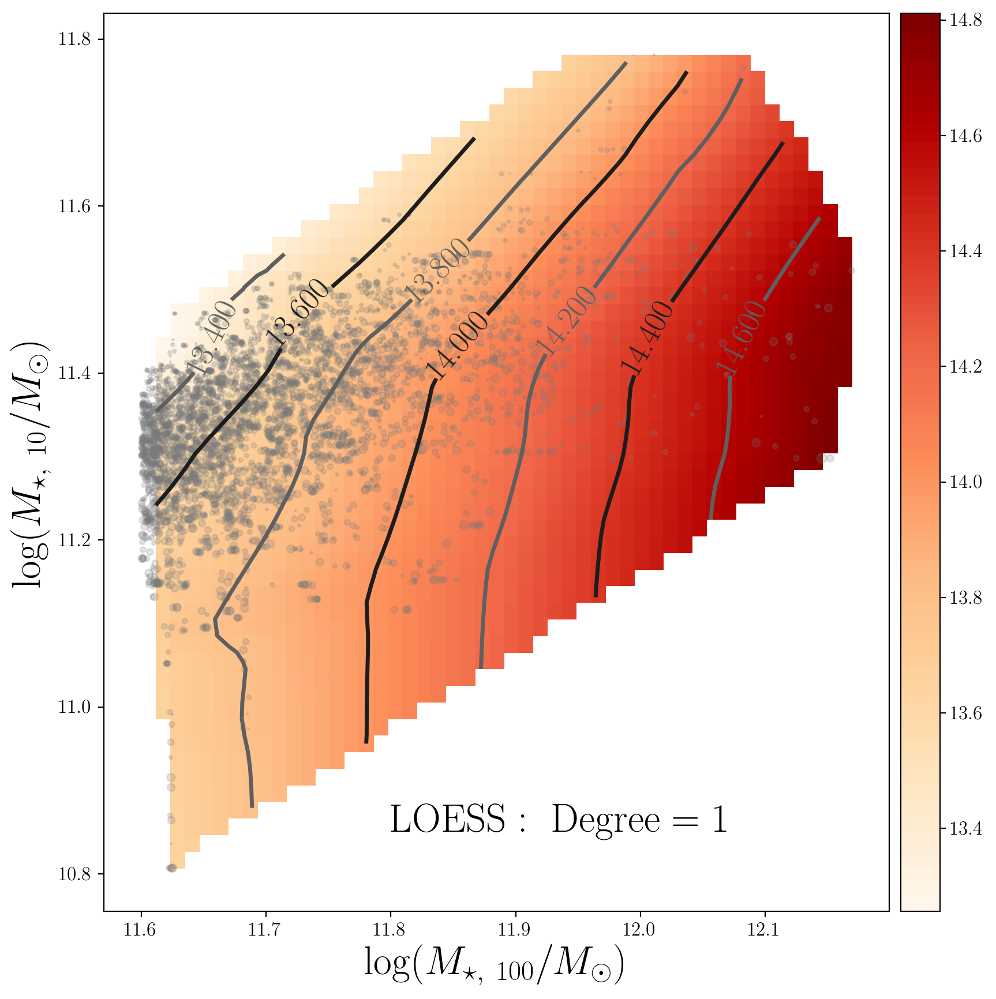

In [9]:
xtickFormat='$\mathbf{%4.1f}$'
ytickFormat='$\mathbf{%4.1f}$'

ORG = plotting.ORG
BLK = plotting.BLK

nColors = 100
nTicks = 10

# --------------------------------------------------------------------------------------- #
fig = plt.figure(figsize=(9, 9))
fig.subplots_adjust(left=0.19, right=0.995, 
                    bottom=0.13, top=0.995,
                    wspace=0.00, hspace=0.00)
# --------------------------------------------------------------------------------------- #

ax1 = fig.add_subplot(111)
#ax1 = plotting.songAxisSetup(ax1, ylabel=45, xlabel=45, border=4.0, 
#                             xtickFormat=xtickFormat, ytickFormat=ytickFormat)


# --------------------------------------------------------------------------------------- #
xMin, xMax = np.nanmin(xx), np.nanmax(xx)
yMin, yMax = np.nanmin(yy), np.nanmax(yy)
zMin, zMax = np.nanmin(zout), np.nanmax(zout)
cLevels = np.linspace(zMin, zMax, nColors)
xi = np.linspace(xMin, xMax, 50)
yi = np.linspace(yMin, yMax, 50)
zi = ml.griddata(xx, yy, zout, xi, yi)

CS1 = ax1.contour(xi, yi, zi, 7, linewidths=2.5, 
                  colors=[BLK(0.7), BLK(0.9)], 
                  extend='neither')
ax1.clabel(CS1, inline=1, fontsize=20)

CM = ax1.pcolormesh(xi, yi, zi, cmap=ORG)

for c in zContour.collections:    # Remove white gaps in contour levels of PDF
    c.set_edgecolor("face")       # http://stackoverflow.com/a/32911283/

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
cTicks = MaxNLocator(nTicks).tick_values(zMin, zMax)
cbar = plt.colorbar(zContour, cax=cax, ticks=cTicks)
cbar.solids.set_edgecolor("face")  # Remove gaps in PDF http://stackoverflow.com/a/15021541
# --------------------------------------------------------------------------------------- #

ax1.scatter(xx, yy, marker='o',
            s=(zout - zz) * 50,
            c=BLK(0.6), alpha=0.2, rasterized=True)

ax1.set_xlabel('$\log (M_{\star,\ \mathrm{100}}/M_{\odot})$', size=25)
ax1.set_ylabel('$\log (M_{\star,\ \mathrm{10}}/M_{\odot})$', size=25)

ax1.text(11.80, 10.85, r'$\mathrm{LOESS:\ Degree=1}$', size=25)

## MCMC run

In [ ]:
um2.mcmcFit()

# Setup the sampler ...
# Setup the initial guesses ...
# Phase: Burn-in ...


/usr/local/lib/python2.7/site-packages/halotools/utils/inverse_transformation_sampling.py:123: UserWarning: npts_y = 42 is less than  npts_lookup_table = 1000.
Setting npts_lookup_table to 42
  "Setting npts_lookup_table to {0}".format(npts_y, npts_lookup_table))
/usr/local/lib/python2.7/site-packages/halotools/utils/inverse_transformation_sampling.py:123: UserWarning: npts_y = 44 is less than  npts_lookup_table = 1000.
Setting npts_lookup_table to 44
  "Setting npts_lookup_table to {0}".format(npts_y, npts_lookup_table))
/usr/local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:990: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


-418.53572603


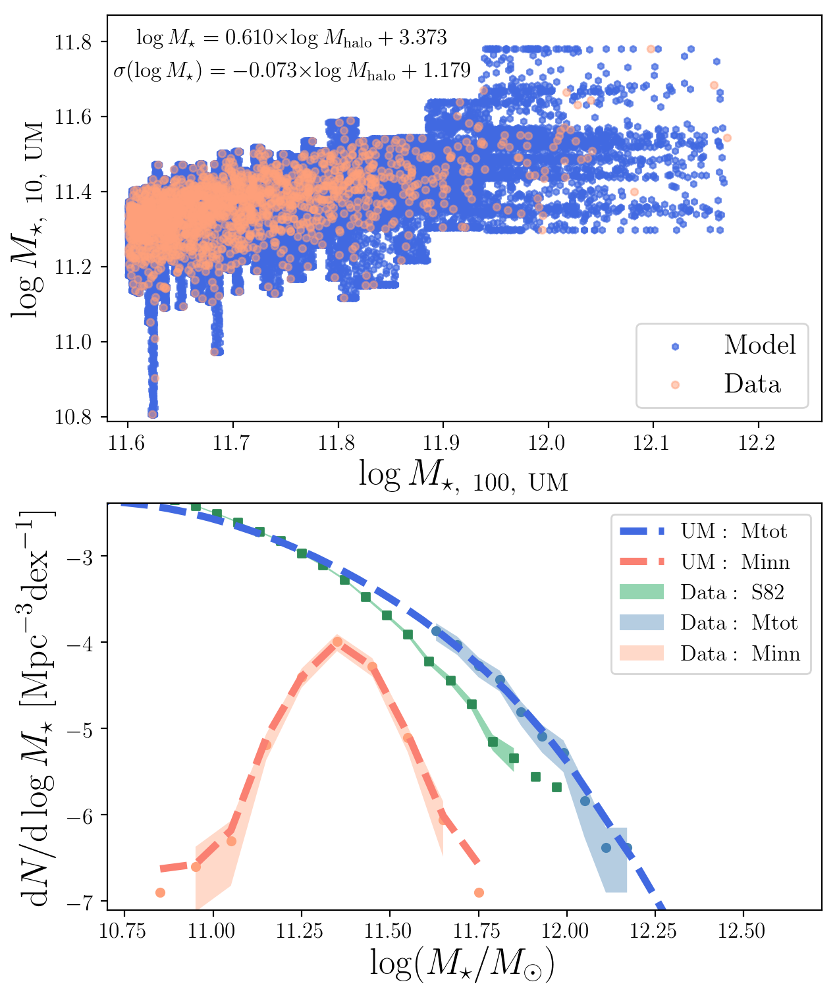

In [104]:
# Provide the model parameters
shmr_a, shmr_b = um2.shmr_a_mcmc[0], um2.shmr_b_mcmc[0]
sigms_a, sigms_b = um2.sigms_a_mcmc[0], um2.sigms_b_mcmc[0]

# Generate the model predictions
um_model = um2.umPredictModel(shmr_a, shmr_b, sigms_a, sigms_b,
                             return_wl_mhalo=True)

(um_smf_tot, um_smf_inn, um_wl_profs, 
 logms_mod_inn, logms_mod_tot_all, mask_mtot) = um_model

logms_mod_tot = logms_mod_tot_all[mask_mtot]
um_smf_tot_all = um2.computeSMF(logms_mod_tot_all,
                                um2.um_volume,
                                30, 10.60, 12.4,
                                bootstrap=False)

um2.umPlotSMF(um_smf_tot_all, um_smf_inn, 
              logms_mod_tot, logms_mod_inn,
              shmr_a=shmr_a, shmr_b=shmr_b, 
              sigms_a=sigms_a, sigms_b=sigms_b)

# Get the lnLikelihood
theta = (shmr_a, shmr_b, sigms_a, sigms_b)
lnlike_smf = um2.lnLike(theta)
print(lnlike_smf)

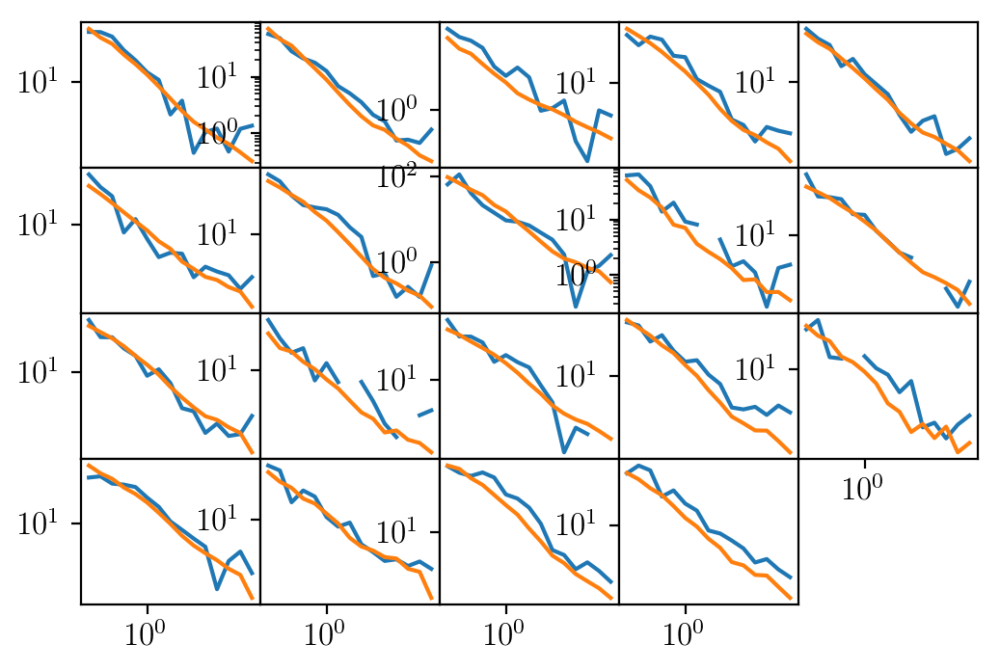

In [105]:
# WL profiles
fig2 = um2.umPlotWL(um_wl_profs)

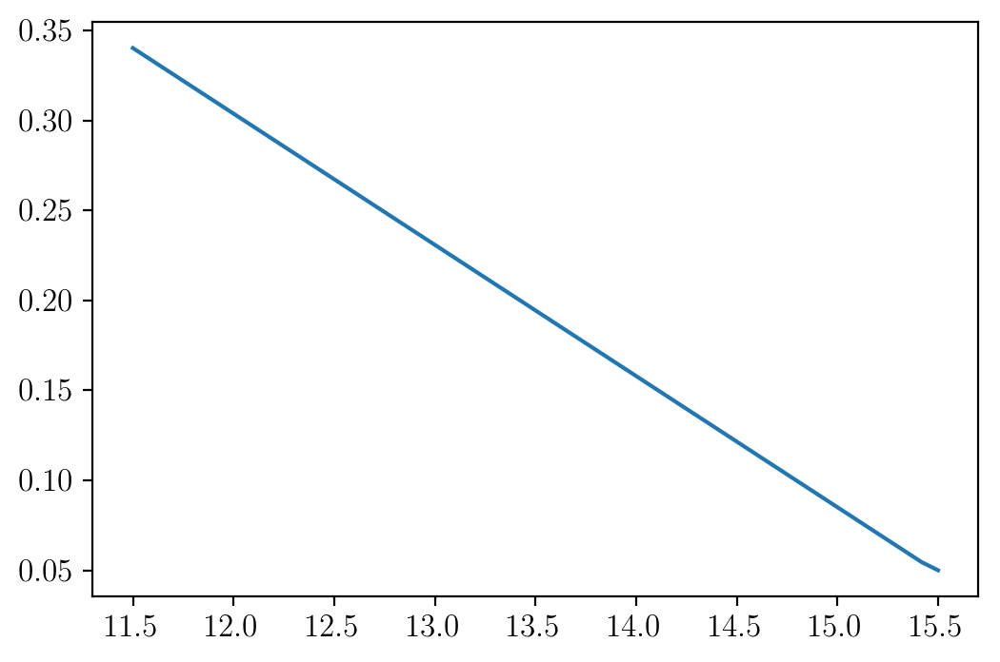

In [106]:
aa = np.linspace(11.5, 15.5, 50)
plt.plot(aa, um2.mockGetSimpleMhScatter(aa, um2.sigms_a_mcmc[0], um2.sigms_b_mcmc[0]))

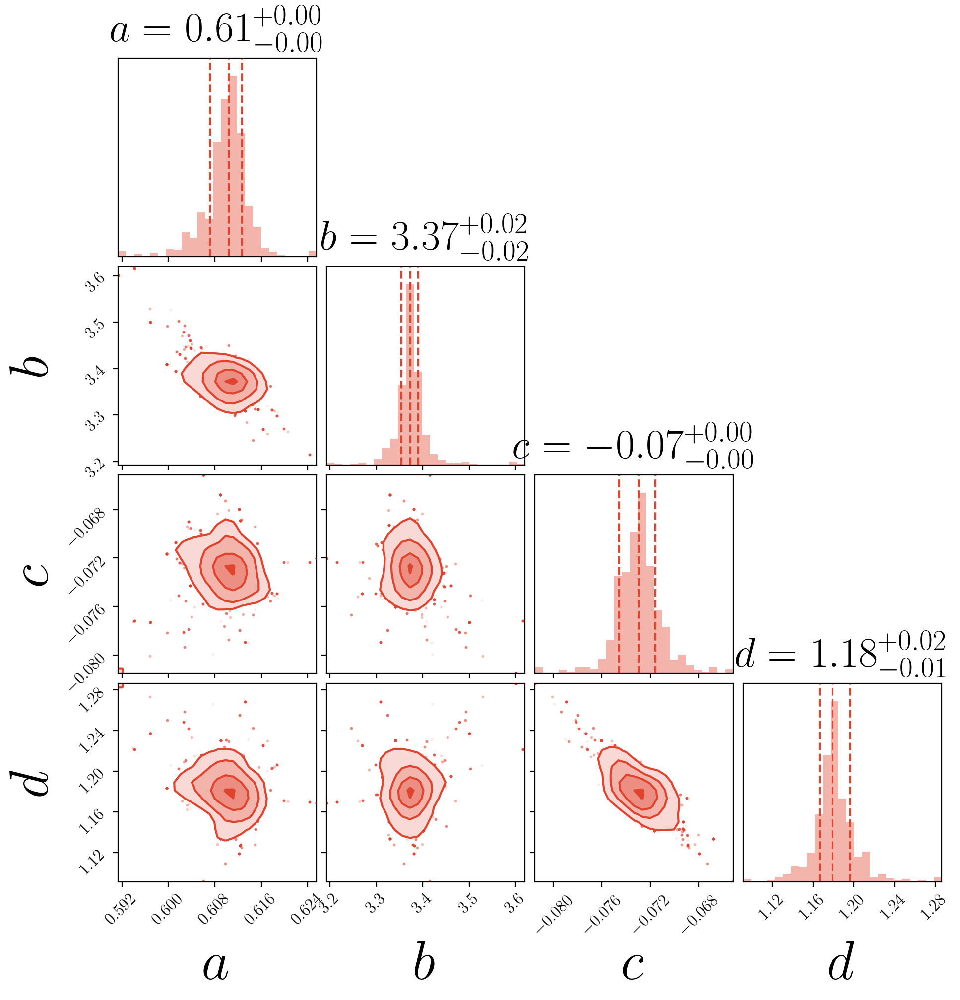

In [110]:
import corner
from palettable.colorbrewer.sequential import OrRd_9
ORG = OrRd_9.mpl_colormap

fig = corner.corner(
    um2.mcmc_samples,
    bins=25, color=ORG(0.7),
    smooth=1, labels=um2.mcmc_labels,
    label_kwargs={'fontsize': 40},
    quantiles=[0.16, 0.5, 0.84],
    plot_contours=True,
    fill_contours=True,
    show_titles=True,
    title_kwargs={"fontsize": 30},
    hist_kwargs={"histtype": 'stepfilled',
                 "alpha": 0.4,
                 "edgecolor": "none"},
    use_math_text=True
)

In [112]:
mock = um2.um_mock
mock_massive = mock[mask_mtot]

logms_mod_tot = logms_mod_tot_all[mask_mtot]

In [134]:
mock.add_column(Column(logms_mod_tot_all, name='logms_100'))

In [113]:
mock_massive.add_column(Column(logms_mod_tot, name='logms_100'))
mock_massive.add_column(Column(logms_mod_inn, name='logms_10'))

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:12: RuntimeWarning: Mean of empty slice


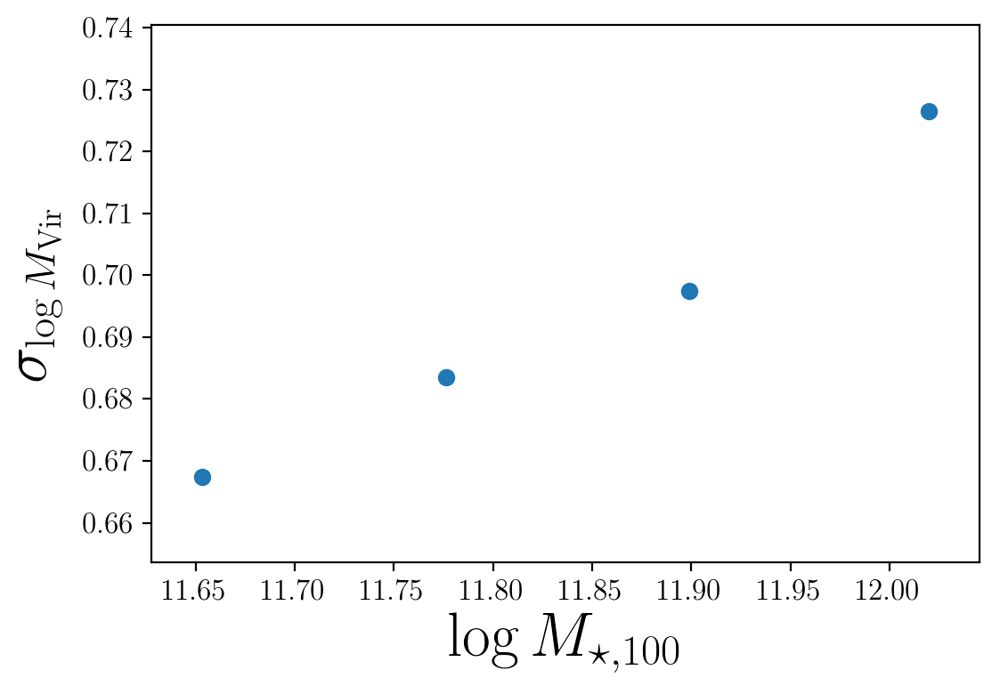

In [151]:
mask_cen = mock_massive['mask_central']
mock_central = mock_massive[mask_cen]

mstar_bin = np.linspace(11.6, 12.1, 5)

log_ms = mock_central['logms_100']
log_mh = mock_central['logmh_vir']

idx_mstar = np.digitize(log_ms, mstar_bin)

mstar_center = [np.nanmean(log_ms[idx_mstar == k])
                for k in range(len(mstar_bin))]
sigma_mhalo = [np.nanstd(log_mh[idx_mstar == k])
               for k in range(len(mstar_bin))]

# Fit logMhalo - sigma_Ms_tot relation
# Log-Log Linear relation
sigms_a, sigms_b = np.polyfit(mstar_center,
                              sigma_mhalo,
                              1)

plt.scatter(mstar_center, sigma_mhalo)
plt.xlabel(r'$\log M_{\star, \mathrm{100}}$', fontsize=25)
plt.ylabel(r'$\sigma_{\log M_{\rm Vir}}$', fontsize=25)

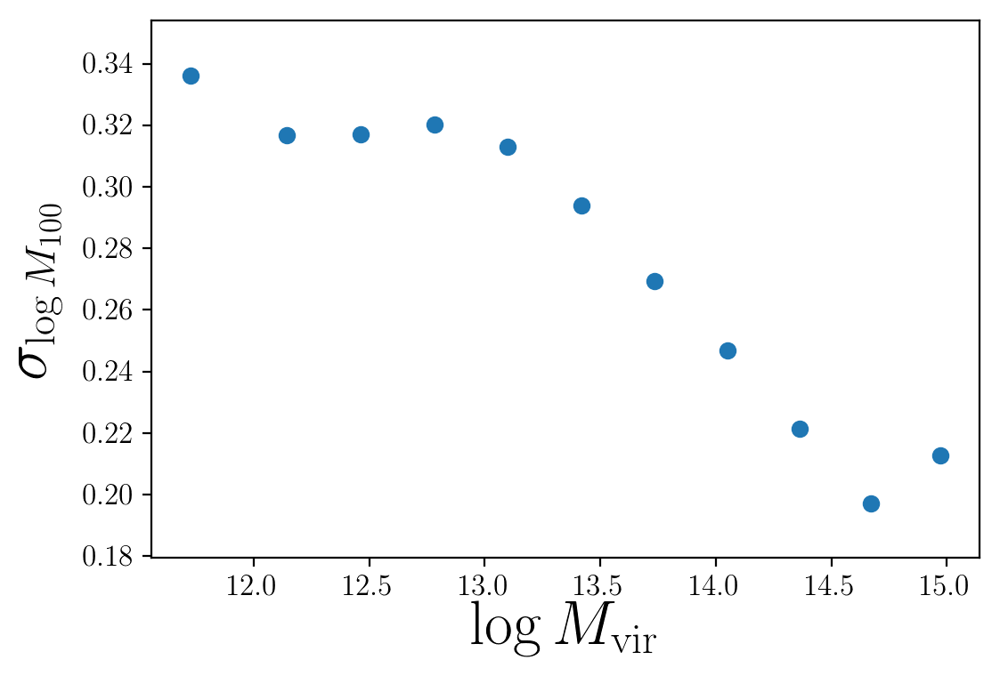

In [140]:
mask_cen = mock['mask_central']

mhalo_bin = np.linspace(12.0, 15.2, 11)

mock_central = mock[mask_cen]
log_mh = mock_central['logmh_vir']
log_ms = mock_central['logms_100']

idx_mhalo = np.digitize(log_mh, mhalo_bin)
mhalo_center = [np.nanmean(log_mh[idx_mhalo == k])
                for k in range(len(mhalo_bin))]
sigma_mstar = [np.nanstd(log_ms[idx_mhalo == k])
               for k in range(len(mhalo_bin))]

# Fit logMhalo - sigma_Ms_tot relation
# Log-Log Linear relation
sigms_a, sigms_b = np.polyfit(mhalo_center,
                              sigma_mstar,
                              1)

plt.scatter(mhalo_center, sigma_mstar)
plt.xlabel(r'$\log M_{\mathrm{vir}}$', fontsize=25)
plt.ylabel(r'$\sigma_{\log M_{\rm 100}}$', fontsize=25)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: Mean of empty slice


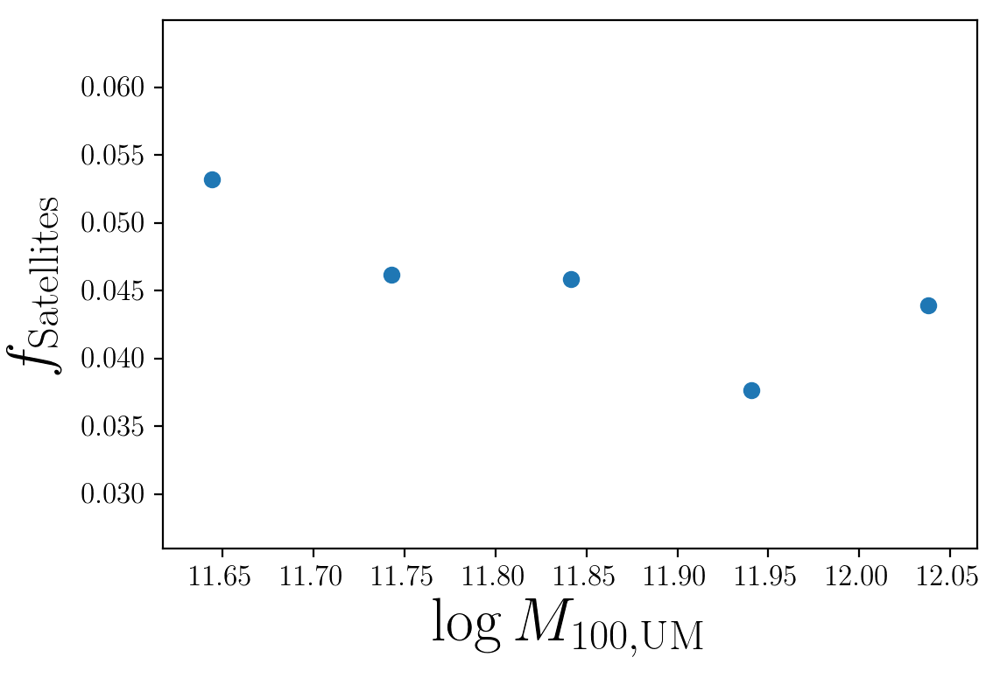

In [132]:
mhalo_bin = np.linspace(11.6, 12.1, 6)
log_mh = mock_massive['logms_100']

idx_mhalo = np.digitize(log_mh, mhalo_bin)
mhalo_center = [np.nanmean(log_mh[idx_mhalo == k])
                for k in range(len(mhalo_bin))]
frac_central = [np.sum(mock_massive['mask_central'][idx_mhalo == k]) * 1.0 / (len(mock_massive[idx_mhalo == k]))
                for k in range(len(mhalo_bin))]

plt.scatter(mhalo_center, 1.0 - np.asarray(frac_central))
plt.xlabel(r'$\log M_{\mathrm{100, UM}}$', fontsize=25)
plt.ylabel(r'$f_{\rm Satellites}$', fontsize=25)

In [126]:
mask_cen = mock_massive['upid'] == -1
np.sum(mask_cen) * 1.0 / len(mock_massive)

0.95008818632864656

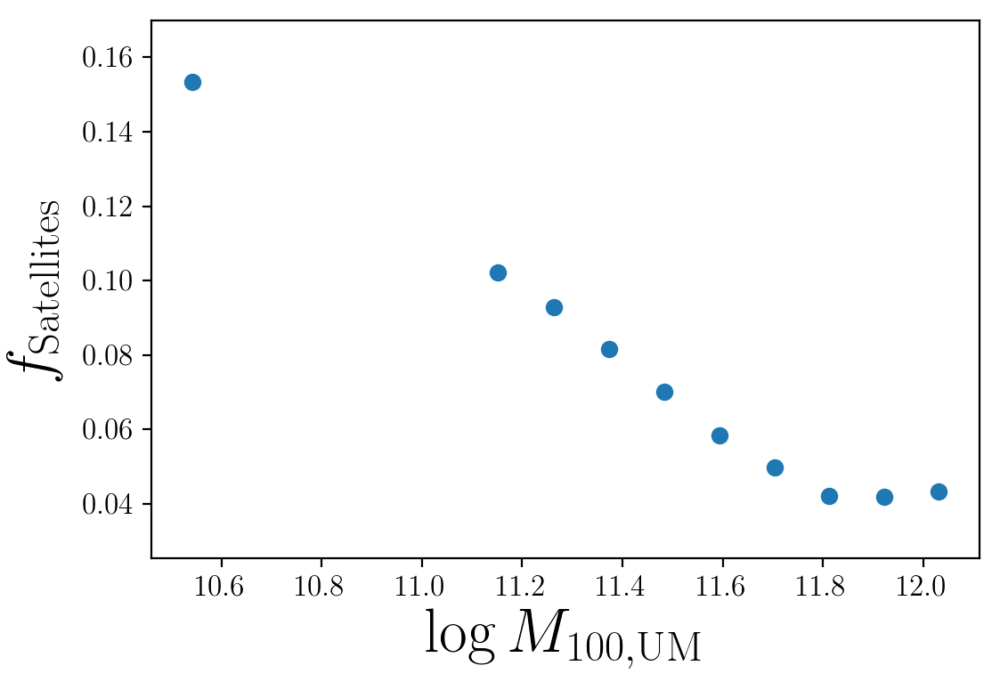

In [137]:
mhalo_bin = np.linspace(11.1, 12.1, 10)
log_mh = mock['logms_100']

idx_mhalo = np.digitize(log_mh, mhalo_bin)
mhalo_center = [np.nanmean(log_mh[idx_mhalo == k])
                for k in range(len(mhalo_bin))]
frac_central = [np.sum(mock['mask_central'][idx_mhalo == k]) * 1.0 / (len(mock[idx_mhalo == k]))
                for k in range(len(mhalo_bin))]

plt.scatter(mhalo_center, 1.0 - np.asarray(frac_central))
plt.xlabel(r'$\log M_{\mathrm{100, UM}}$', fontsize=25)
plt.ylabel(r'$f_{\rm Satellites}$', fontsize=25)

In [156]:
mask_cen = mock_massive['upid'] == -1
mock_cen = mock_massive[mask_cen]

random_index = np.random.choice(np.arange(len(mock_cen)), 
                                5000, replace=False)

xx = np.asarray(mock_cen[random_index]['logms_100'])
yy = np.asarray(mock_cen[random_index]['logms_10'])
zz = np.asarray(mock_cen[random_index]['logmh_vir'])
sigz = zz * 0.0 + 0.02
zout, wout = loess_2d(xx, yy, zz, 
                      degree=1, sigz=sigz)
# --------------------------------------------------------------------------------------- #

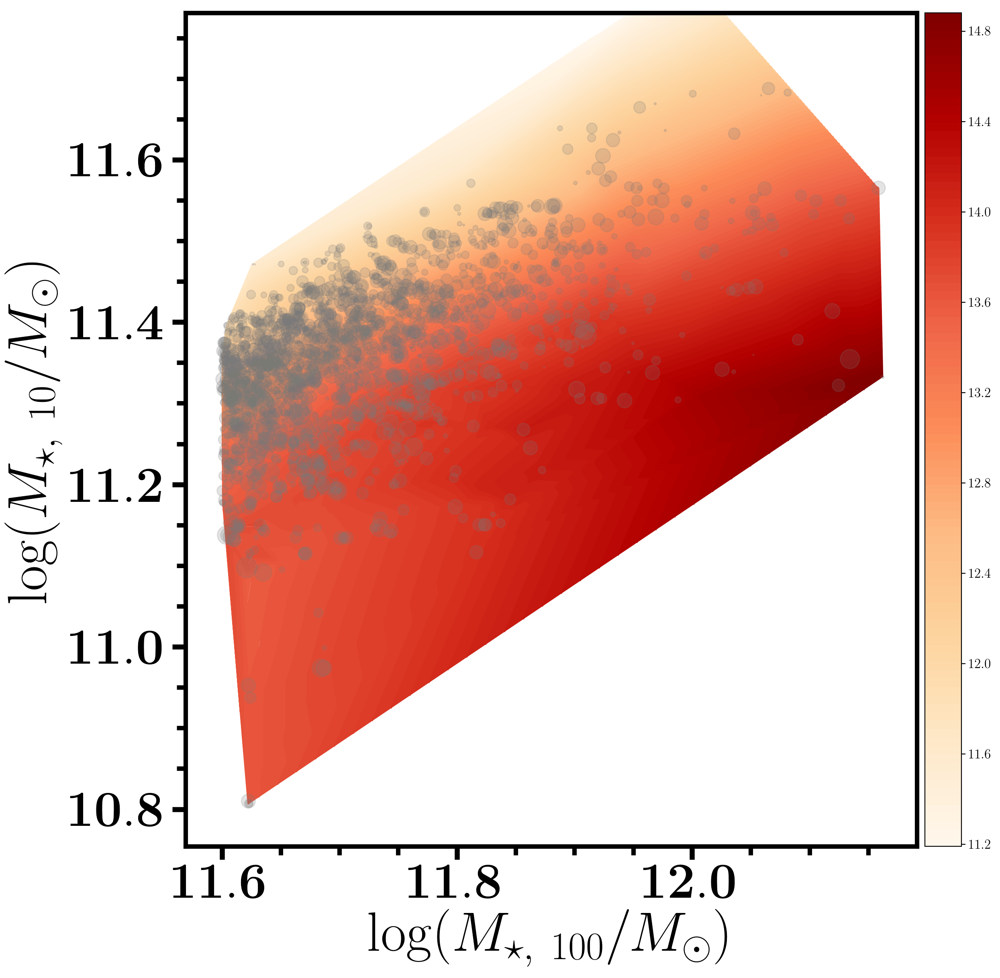

In [157]:
xtickFormat='$\mathbf{%4.1f}$'
ytickFormat='$\mathbf{%4.1f}$'

ORG = plotting.ORG
BLK = plotting.BLK

# --------------------------------------------------------------------------------------- #
fig = plt.figure(figsize=(12, 12))
fig.subplots_adjust(left=0.19, right=0.995, 
                    bottom=0.13, top=0.995,
                    wspace=0.00, hspace=0.00)
# --------------------------------------------------------------------------------------- #

ax1 = fig.add_subplot(111)
ax1 = plotting.songAxisSetup(ax1, ylabel=45, xlabel=45, border=4.0, 
                             xtickFormat=xtickFormat, ytickFormat=ytickFormat)


# --------------------------------------------------------------------------------------- #
xShow, yShow, zShow = map(np.ravel, [xx, yy, zout])
zMin, zMax = np.nanmin(zShow), np.nanmax(zShow)
nColors = 100
nTicks = 10
cLevels = np.linspace(zMin, zMax, nColors)

zContour = ax1.tricontourf(xShow, yShow, zShow, levels=cLevels, 
                           cmap=ORG, extend='neither')
for c in zContour.collections:    # Remove white gaps in contour levels of PDF
    c.set_edgecolor("face")       # http://stackoverflow.com/a/32911283/
    
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
cTicks = MaxNLocator(nTicks).tick_values(zMin, zMax)
cbar = plt.colorbar(zContour, cax=cax, ticks=cTicks)
cbar.solids.set_edgecolor("face")  # Remove gaps in PDF http://stackoverflow.com/a/15021541
# --------------------------------------------------------------------------------------- #

ax1.scatter(xx, yy, marker='o',
            s=(zout - zz) * 200,
            c=BLK(0.6), alpha=0.2, rasterized=True)

ax1.set_xlabel('$\log (M_{\star,\ \mathrm{100}}/M_{\odot})$', size=50)
ax1.set_ylabel('$\log (M_{\star,\ \mathrm{10}}/M_{\odot})$', size=50)

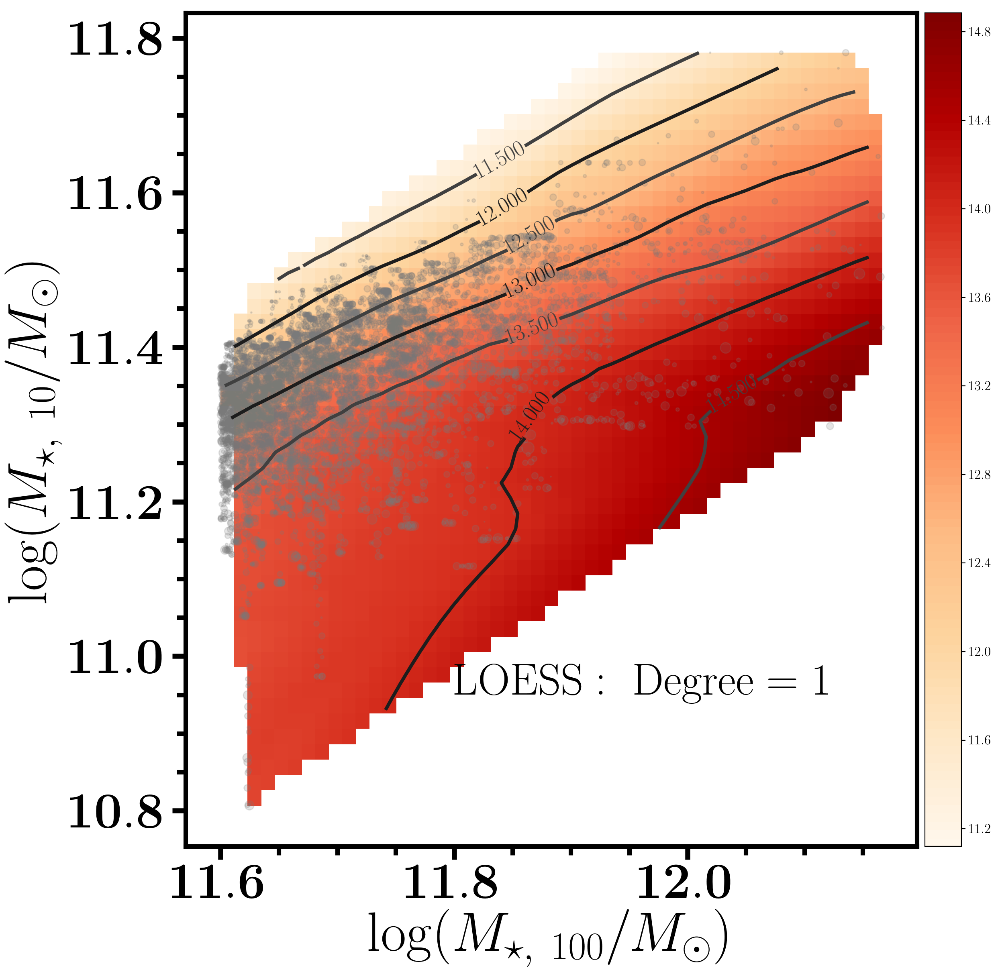

In [150]:
xtickFormat='$\mathbf{%4.1f}$'
ytickFormat='$\mathbf{%4.1f}$'

ORG = plotting.ORG
BLK = plotting.BLK

nColors = 100
nTicks = 10

# --------------------------------------------------------------------------------------- #
fig = plt.figure(figsize=(12, 12))
fig.subplots_adjust(left=0.19, right=0.995, 
                    bottom=0.13, top=0.995,
                    wspace=0.00, hspace=0.00)
# --------------------------------------------------------------------------------------- #

ax1 = fig.add_subplot(111)
ax1 = plotting.songAxisSetup(ax1, ylabel=45, xlabel=45, border=4.0, 
                             xtickFormat=xtickFormat, ytickFormat=ytickFormat)


# --------------------------------------------------------------------------------------- #
xMin, xMax = np.nanmin(xx), np.nanmax(xx)
yMin, yMax = np.nanmin(yy), np.nanmax(yy)
zMin, zMax = np.nanmin(zout), np.nanmax(zout)
cLevels = np.linspace(zMin, zMax, nColors)
xi = np.linspace(xMin, xMax, 50)
yi = np.linspace(yMin, yMax, 50)
import matplotlib.mlab as ml
zi = ml.griddata(xx, yy, zout, xi, yi)

CS1 = ax1.contour(xi, yi, zi, 8, linewidths=3.0, 
                  colors=[BLK(0.8), BLK(0.9)], 
                  extend='neither')
ax1.clabel(CS1, inline=1, fontsize=20)

CM = ax1.pcolormesh(xi, yi, zi, cmap=ORG)

for c in zContour.collections:    # Remove white gaps in contour levels of PDF
    c.set_edgecolor("face")       # http://stackoverflow.com/a/32911283/

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
cTicks = MaxNLocator(nTicks).tick_values(zMin, zMax)
cbar = plt.colorbar(zContour, cax=cax, ticks=cTicks)
cbar.solids.set_edgecolor("face")  # Remove gaps in PDF http://stackoverflow.com/a/15021541
# --------------------------------------------------------------------------------------- #

ax1.scatter(xx, yy, marker='o',
            s=(zout - zz) * 50,
            c=BLK(0.6), alpha=0.2, rasterized=True)

ax1.set_xlabel('$\log (M_{\star,\ \mathrm{100}}/M_{\odot})$', size=50)
ax1.set_ylabel('$\log (M_{\star,\ \mathrm{10}}/M_{\odot})$', size=50)

ax1.text(11.80, 10.95, r'$\mathrm{LOESS:\ Degree=1}$', size=40)